In [1]:
#sc-12
#"""
#data
#└── plant
#    ├── GSE152766_sc_12_COPILOT.rds
#    └── tair.gaf
#
#"""
#read the rds data
data = readRDS("data/plant/GSE152766_sc_12_COPILOT.rds")



In [7]:
str(data)
data@assays$RNA@counts

  [[ suppressing 32 column names ‘AAACCCAAGCCATTCA’, ‘AAACCCAAGCTGTTCA’, ‘AAACCCAAGGCGAACT’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGCCATTCA’, ‘AAACCCAAGCTGTTCA’, ‘AAACCCAAGGCGAACT’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGCCATTCA’, ‘AAACCCAAGCTGTTCA’, ‘AAACCCAAGGCGAACT’ ... ]]



26291 x 10293 sparse Matrix of class "dgCMatrix"
                                                                                             
AT1G01010  .   2   5   .   .  1  .   10  1   .  .  13   1   .   .   .   5  5  1  .   2  .   .
AT1G01020  1   .   1   .   .  1  .    5  .   .  .   .   1   .   .   .   2  .  .  .   3  .   2
AT1G03987  .   .   .   .   .  .  .    .  .   .  .   .   .   .   .   .   .  .  .  .   .  .   .
AT1G01030  .   .   .   .   .  .  .    .  .   .  .   .   .   .   .   .   .  .  .  .   .  .   .
AT1G01040  .   .   .   .   .  .  .    .  .   2  .   .   .   .   .   .   .  .  .  .   .  .   .
AT1G01050  2  10   1   1   1  2  5   16  1  21  5   4   5   .   3   8   1  .  .  .   2  1  21
AT1G01060  .   .   .   .   .  .  .    .  .   .  .   2   .   .   .   .   .  .  .  .   2  1   .
AT1G01070  .   .   .   .   .  .  .    .  .   1  .   7   .   .   .   .   .  .  .  .   .  .   .
AT1G04003  .   .   .   .   .  .  .    .  .   .  .   .   .   .   .   .   .  .  .  .   .  .   .
AT1G01080  

In [14]:
umap_data <- Embeddings(data, reduction = "umap")
umap_data

#save umap data
write.csv(umap_data, "data/plant/sc_12_umap_data.csv")

,UMAP_1,UMAP_2
AAACCCAAGCCATTCA,3.1298568,2.9358397
AAACCCAAGCTGTTCA,8.4812298,0.6180184
AAACCCAAGGCGAACT,3.1953044,-6.5942464
AAACCCACACCAGCCA,2.7696168,11.4260616
AAACCCACACTGGCGT,3.1136982,12.3845892
AAACCCACAGACCTGC,-5.8502374,9.7696829
AAACCCAGTCCACAGC,-4.7528124,9.6372385
AAACCCAGTCGGCACT,3.6921432,-3.2158854
AAACCCAGTGAGACCA,-7.8891897,-4.4311543
AAACCCAGTGCGTGCT,-5.3449883,-8.1350031


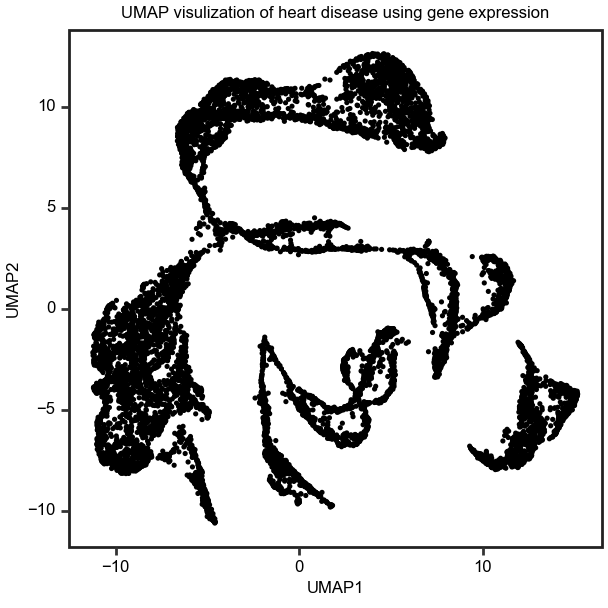

In [2]:
#read sc_12 umap data
import pandas as pd

sc_12_umap_data = pd.read_csv("data/plant/sc_12_umap_data.csv",index_col=0)
sc_12_umap_data

#visualize the umap data using plotnine



#import matplotlib.pyplot as plt
from plotnine import *
import pandas as pd



black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"




data = pd.read_csv("data/plant/sc_12_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]




p =(ggplot(aes(x='UMAP1', y='UMAP2'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of heart disease using gene expression")
    #+scale_fill_manual(values=[c1, c2, c3])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_gene_expression_UMAP.pdf')



In [15]:
#Ground tissue
library(Seurat)
data=readRDS("data/plant/GSE152766_Ground_Tissue_Atlas.rds")

#read umap data
umap_data <- Embeddings(data, reduction = "umap")
umap_data

#save umap data
write.csv(umap_data, "data/plant/sc_ground_tissue_umap_data.csv")


#read rna counts
sparse_matrix=data@assays$RNA@counts
dense_matrix <- as.matrix(sparse_matrix)

# Save the dense matrix to a CSV file
write.csv(dense_matrix, file = "data/plant/ground_tissue_counts.csv", row.names = TRUE)



,UMAP_1,UMAP_2
AAACCCAAGGCGAACT_1,3.4722700,-5.7266898
AAACCCAGTCGGCACT_1,3.4780350,0.6031625
AAACCCATCTCAGGCG_1,-1.5104201,-1.1017674
AAACGAACACTTTATC_1,-1.7375234,1.3696986
AAACGAACAGAGTCTT_1,4.9143105,-1.3829432
AAACGCTGTGAGACCA_1,8.2885532,0.1702000
AAAGAACAGCCTTTCC_1,-11.2384672,-9.0060892
AAAGAACGTTGTTTGG_1,4.2575250,-4.3367815
AAAGGATGTCCTCAGG_1,-10.0229874,-10.7979994
AAAGGATGTTCGGCGT_1,3.4160309,-4.2832241


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 4.9 GiB”


In [14]:
str(data)


Formal class 'Seurat' [package "Seurat"] with 13 slots
  ..@ assays      :List of 3
  .. ..$ RNA       :Formal class 'Assay' [package "Seurat"] with 8 slots
  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:79299449] 0 1 5 10 11 12 14 15 17 26 ...
  .. .. .. .. .. ..@ p       : int [1:22601] 0 5211 13614 20193 26405 31111 35722 44784 48336 55650 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 28958 22600
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:28958] "AT1G01010" "AT1G01020" "AT1G03987" "AT1G01030" ...
  .. .. .. .. .. .. ..$ : chr [1:22600] "AAACCCAAGGCGAACT_1" "AAACCCAGTCGGCACT_1" "AAACCCATCTCAGGCG_1" "AAACGAACACTTTATC_1" ...
  .. .. .. .. .. ..@ x       : num [1:79299449] 5 1 1 2 1 1 1 12 2 5 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:79299449] 0 1 5 10 11 12 1

In [13]:
sparse_matrix

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]



24997 x 22600 sparse Matrix of class "dgCMatrix"
                                                                                             
AT1G01010   4   3   .   1  .   1   .   2  .   1  .   .   1   3   4   2   1   .   1   .  .   .
AT1G01020   1   1   .   2  .   .   .   .  .   .  .   .   .   .   1   1   .   .   1   2  .   .
AT1G01030   .   .   .   .  .   .   .   .  .   .  1   .   .   .   .   .   .   .   .   .  .   .
AT1G01040   .   .   .   .  .   .   .   .  1   1  .   .   .   1   .   .   .   .   .   1  .   .
AT1G01050   1   3   2   1  1   1   6   .  4   .  .   .   4   3   1   2   .   1   2   4  5   .
AT1G01060   .   .   .   1  1   .   .   .  .   .  .   .   .   1   .   .   .   .   1   2  .   .
AT1G01070   .   .   .   .  .   .   .   .  .   .  .   .   .   .   .   .   .   .   .   .  .   .
AT1G01080   .   .   .   .  .   1   .   .  .   .  .   .   .   .   .   .   .   .   .   .  .   .
AT1G01090   2   .   1   .  3   .   6   .  6   2  .   .   .   1   .   .   .   1   1   1  2   .
AT1G01100  

In [5]:
gene_expression_matrix <- data@assays$integrated@counts

In [6]:
gene_expression_matrix

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAAGGCGAACT_1’, ‘AAACCCAGTCGGCACT_1’, ‘AAACCCATCTCAGGCG_1’ ... ]]



17513 x 22600 sparse Matrix of class "dgCMatrix"
                                                                                    
AT1G05260  .            .          10.000000000 1.000000e+01 10.00000000  .         
AT3G59370  .            .           .           .             .           .         
AT2G36100  .            .           .           .             .           .         
AT1G12080  .            .           .           .             .           .         
AT1G12090 10.000000000 10.00000000  2.879431946 4.346150e+00 10.00000000 10.00000000
AT4G11290  .            .          10.000000000 1.000000e+01  7.60940847  .         
AT5G42180  .            .           .           .             5.50087803  .         
AT5G66390  .            .           0.204053080 .             1.32473468  .         
AT2G32300  .            .           3.135169177 1.000000e+01  0.34648321  .         
AT2G02130  .            .           .           .             .           .         
AT3G11550  .    

In [2]:
#save cell type
cell_type=data@meta.data$celltype.anno
write.csv(cell_type, "data/plant/sc_ground_tissue_cell_type.csv")

#save development stage
development_stage=data@meta.data$time.anno
write.csv(development_stage, "data/plant/sc_ground_tissue_development_stage.csv")

# save pseduotime
pseudotime = data@meta.data$consensus.time.group
write.csv(pseudotime, "data/plant/sc_ground_tissue_pseudotime.csv")

In [112]:
import pandas as pd

cell_type=pd.read_csv("data/plant/sc_ground_tissue_cell_type.csv",index_col=0)
cell_type["x"].to_list()

['Cortex',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Endodermis',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Cortex',
 'Endodermis',
 'Quiescent Center',
 'Cortex',
 'Cortex',
 'Cortex',
 'End

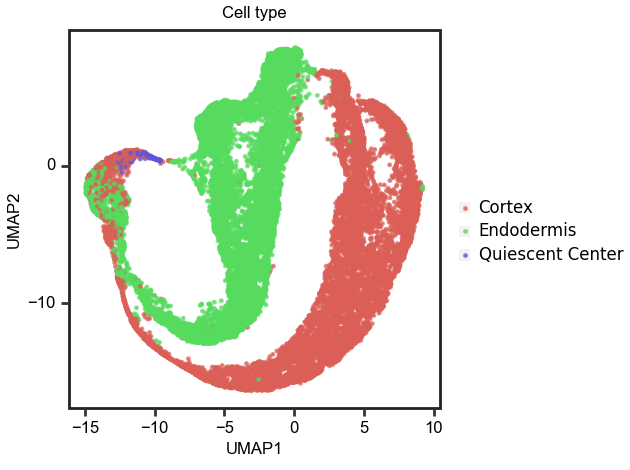

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.1500000000000004 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_cell_type_ground_truth_UMAP.pdf


In [114]:
#UMAP cell type
from plotnine import *
import pandas as pd



black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"




data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

cell_type=pd.read_csv("data/plant/sc_ground_tissue_cell_type.csv",index_col=0)
cell_type=cell_type["x"].to_list()
data["cell_type"]=cell_type

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(cell_type)"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[2.35+0.8,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Cell type")
    #+scale_fill_manual(values=[c1, c2, c3])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_cell_type_ground_truth_UMAP.pdf')



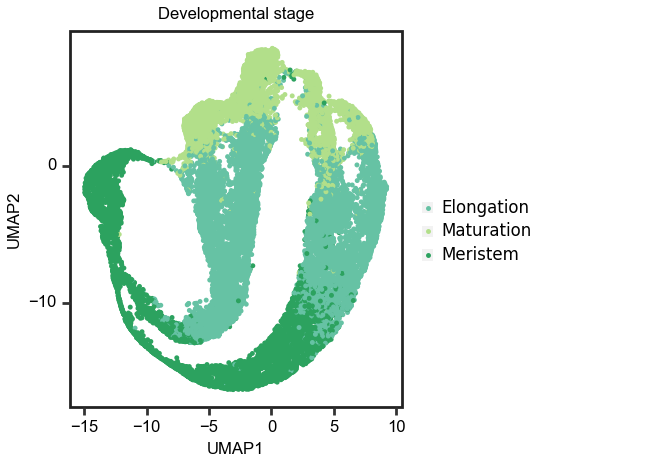

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.3500000000000005 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_developmental_stage_ground_truth_UMAP.pdf


In [123]:
#UMAP development stage
from plotnine import *
import pandas as pd



black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"




data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

developmental_stage=pd.read_csv("data/plant/sc_ground_tissue_development_stage.csv",index_col=0)
developmental_stage=developmental_stage["x"].to_list()
data["developmental_stage"]=developmental_stage

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(developmental_stage)"))
    + geom_point(size=0.001,alpha=1)
    +theme(
        figure_size=[2.35+0.8+0.2,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Developmental stage")
    +scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_developmental_stage_ground_truth_UMAP.pdf')



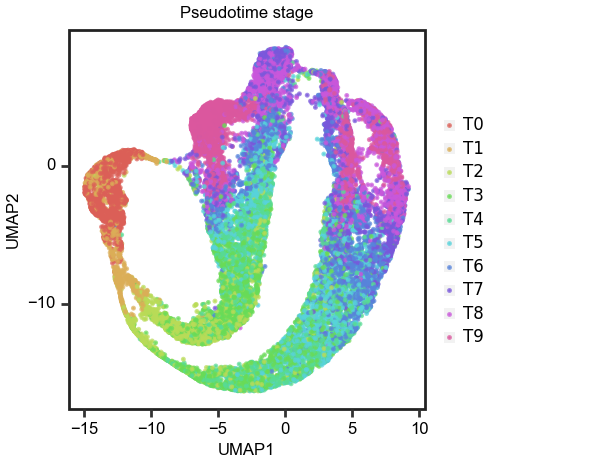

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.05 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_pseudotime_ground_truth_UMAP.pdf


In [126]:
#UMAP pseudotime
from plotnine import *
import pandas as pd



black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"




data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

pseudotime=pd.read_csv("data/plant/sc_ground_tissue_pseudotime.csv",index_col=0)
pseudotime=pseudotime["x"].to_list()
data["pseudotime"]=pseudotime

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(pseudotime)"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[2.35+0.7,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Pseudotime stage")
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_pseudotime_ground_truth_UMAP.pdf')



In [2]:
#prepare DAP genes for scGO analysis

#remove amp results


import os
import shutil

def remove_subdirs_with_string(root_dir, substring):
    for dirpath, dirnames, filenames in os.walk(root_dir, topdown=False):
        for dirname in dirnames[:]:
            if substring in dirname:
                shutil.rmtree(os.path.join(dirpath, dirname))

# Replace 'root_directory' with the path of the directory containing the subdirectories you want to remove.
root_directory = 'data/plant/dap_data_v4'
substring_to_remove = "amp"

remove_subdirs_with_string(root_directory, substring_to_remove)


In [3]:
#merge all txt files in a directory into one txt file
import os

def merge_text_files(root_dir, output_file):
    with open(output_file, 'w') as merged_file:
        for dirpath, _, filenames in os.walk(root_dir):
            for filename in filenames:
                if filename.endswith('.txt'):
                    file_path = os.path.join(dirpath, filename)
                    with open(file_path, 'r') as infile:
                        merged_file.write(infile.read())

# Replace 'root_directory' with the path of the root directory containing the text files.
root_directory = 'data/plant/dap_data_v4'
output_file_path = 'data/plant/DAP_TF_gene.txt'

merge_text_files(root_directory, output_file_path)

In [127]:
#preprare TF 
import pickle

TF_gene_dict={}          #{TF:[gene]}
gene_TF_dict={}          #{gene:[TF]}

with open("data/plant/DAP_TF_gene.txt") as f:
    for line in f:
        if "id" in line:
            continue
        
        line=line.rstrip()

        TF=line.split("\t")[0]
        gene_name=line.split("\t")[1]
        #print(TF,gene_name)
        if TF not in TF_gene_dict:
            TF_gene_dict[TF]=[]

        #if gene_name not in TF_gene_dict[TF]:
        TF_gene_dict[TF].append(gene_name)

        if gene_name not in gene_TF_dict:
            gene_TF_dict[gene_name]=[]
        #if TF not in gene_TF_dict[gene_name]:
        gene_TF_dict[gene_name].append(TF)
            
print("Number of TFs: ",len(TF_gene_dict))

pickle.dump(TF_gene_dict,open("data/plant/TF_gene_dict","wb"))
pickle.dump(gene_TF_dict,open("data/plant/gene_TF_dict","wb"))

Number of TFs:  349


In [128]:
#prepare GO  term
GO_dict={}
with open("data/plant/tair.gaf") as f:
    for line in f:
        if line[0] == "!":
            continue
        
        gene_id=line.split("\t")[2]
        GO_term=line.split("\t")[4]
        if GO_term not in GO_dict:
            GO_dict[GO_term]=[]
        GO_dict[GO_term].append(gene_id)


GO_list=[]
count=0
for item in GO_dict:
    if len(GO_dict[item])>=20:
        count+=1
        GO_list.append(item)
print(count)

gene_dict={}
with open("data/plant/tair.gaf") as f:
    for line in f:
        if line[0]=="!":
            continue
        gene_id=line.split("\t")[2].upper()
        GO_term=line.split("\t")[4]
        if gene_id not in gene_dict:
            gene_dict[gene_id]=[]
        gene_dict[gene_id].append(GO_term)

1252


In [129]:
#read expression data

#data/plant/ground_tissue_counts.csv
import pandas as pd
import pickle

#read data
data = pd.read_csv('data/plant/ground_tissue_counts.csv', index_col=0)
data = data.T    #gene in column, cell in row

data_sparse=data


#statistics of cells expressing each gene
gene_expressed_cell_number=data_sparse.astype(bool).sum(axis=0)   #axis=0, sum each column

print(len(gene_expressed_cell_number))
#filter gene expressed in less than 10 cells
gene_expressed_cell_number=gene_expressed_cell_number[gene_expressed_cell_number>6000]
print(len(gene_expressed_cell_number))
#filter gene


data_rm_sparse=data_sparse[gene_expressed_cell_number.index.tolist()]
data_rm_sparse

pickle.dump(data_rm_sparse,open('data/plant/data_rm_sparse.pkl','wb'))

28958
4987


In [130]:
import pickle

data_rm_sparse=pickle.load(open('data/plant/data_rm_sparse.pkl','rb'))


#decode colnames to string

data_rm_sparse.columns=data_rm_sparse.columns.astype(str)

#normalize data by row
row_sums = data_rm_sparse.sum(axis=1)   #axis=1, sum by row

data_rm_sparse = data_rm_sparse.div(row_sums, axis=0)*1e4

data_rm_sparse

,AT1G01010,AT1G01050,AT1G01090,AT1G01100,AT1G01140,AT1G01230,AT1G01300,AT1G01350,AT1G01360,AT1G01430,...,ATCG00470,ATCG00500,ATCG00670,ATCG00720,ATCG00740,ATCG00790,ATCG00800,ATCG00820,ATCG01020,ATCG01130
AAACCCAAGGCGAACT_1,2.179124,0.435825,0.871650,0.435825,5.229898,2.179124,2.179124,0.871650,0.000000,1.307474,...,3.050774,4.794073,3.922423,3.486598,3.050774,3.486598,2.179124,1.743299,0.435825,1.743299
AAACCCAGTCGGCACT_1,1.248019,1.996830,0.124802,1.996830,1.372821,0.748811,0.374406,0.748811,0.374406,0.000000,...,1.123217,0.499208,0.249604,1.123217,0.249604,0.873613,0.249604,1.248019,0.249604,1.248019
AAACCCATCTCAGGCG_1,0.276916,1.384581,0.553833,1.661498,0.553833,0.276916,0.276916,0.830749,0.276916,0.000000,...,0.830749,0.276916,0.000000,0.553833,0.830749,0.830749,0.276916,0.276916,0.276916,0.276916
AAACGAACACTTTATC_1,0.508997,0.508997,0.254498,1.526990,0.254498,0.254498,0.254498,0.000000,1.017993,0.000000,...,1.526990,0.254498,0.254498,1.526990,1.272491,3.053979,0.000000,0.508997,0.508997,0.508997
AAACGAACAGAGTCTT_1,0.000000,0.717618,2.152853,0.717618,2.152853,0.000000,0.000000,0.717618,1.435235,0.000000,...,0.000000,1.435235,2.152853,0.717618,2.152853,0.000000,0.717618,2.152853,0.000000,2.870470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCAGTTATCGC_16,0.000000,10.209290,0.000000,30.627871,0.000000,0.000000,5.104645,5.104645,0.000000,0.000000,...,5.104645,15.313936,10.209290,5.104645,15.313936,81.674324,20.418581,51.046452,15.313936,40.837162
TTTGCGCAGAGACTAT_16,0.000000,1.405877,7.029383,29.523408,0.000000,2.811753,0.000000,1.405877,0.000000,1.405877,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.405877,0.000000,1.405877,0.000000,0.000000
TTTGCGCTCGCAGGCT_16,0.000000,0.000000,2.396932,43.144775,0.000000,0.000000,2.396932,0.000000,0.000000,0.000000,...,2.396932,0.000000,4.793864,4.793864,0.000000,11.984660,2.396932,0.000000,0.000000,4.793864
TTTGGTTAGCCGTCGT_16,0.000000,6.821282,0.000000,2.273761,0.000000,2.273761,0.000000,0.000000,0.000000,4.547522,...,0.000000,2.273761,0.000000,0.000000,0.000000,0.000000,0.000000,2.273761,0.000000,0.000000


In [131]:
#generate gene_to_TF_transform_matrix
import numpy as np

TF_gene_dict=pickle.load(open("data/plant/TF_gene_dict","rb"))

#data_rm_sparse=pickle.load(open("data/zheng68k/data_rm_sparse.dataframe","rb"))

gene_number=len(gene_expressed_cell_number.index.tolist())    #3670
print("gene number: ",gene_number)
TF_number=len(TF_gene_dict)
print("TF number: ",TF_number)

gene_to_TF_transform_matrix=np.zeros((gene_number,TF_number))

TF_list=TF_gene_dict.keys()
for i,gene in enumerate(data_rm_sparse.columns):
    try:
        j=TF_list.index("gene")
        gene_to_TF_transform_matrix[i][j]=1
    except:
        pass
        
gene_to_TF_transform_matrix

pickle.dump(gene_to_TF_transform_matrix,open("data/plant/gene_to_TF_transform_matrix","wb"))

gene number:  4987
TF number:  349


In [132]:
#generate TF_mask

import numpy as np

gene_TF_dict=pickle.load(open("data/plant/gene_TF_dict","rb"))

gene_number = len(gene_expressed_cell_number.index.tolist())    #3670

TF_number = len(TF_gene_dict)

TF_mask = np.zeros((gene_number,TF_number))
error_count=0

for i,gene_id in enumerate(data_rm_sparse.columns):

    for j,TF in enumerate(TF_gene_dict):
        if TF in gene_TF_dict.get(gene_id,[]):
            TF_mask[i][j]=1
        else:
            error_count+=1
        
print(error_count)
print(TF_mask)

pickle.dump(TF_mask,open("data/plant/TF_mask","wb"))

1384907
[[0. 0. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [133]:
#generate GO_mask

GO_dict={}
with open("data/plant/tair.gaf") as f:
    for line in f:
        if line[0] == "!":
            continue
        
        gene_id=line.split("\t")[2]
        GO_term=line.split("\t")[4]
        if GO_term not in GO_dict:
            GO_dict[GO_term]=[]
        GO_dict[GO_term].append(gene_id)


GO_list=[]
count=0
for item in GO_dict:
    if len(GO_dict[item])>=20:
        count+=1
        GO_list.append(item)
print(count)


gene_dict={}
with open("data/plant/tair.gaf") as f:
    for line in f:
        if line[0]=="!":
            continue
        gene_id=line.split("\t")[2].upper()
        GO_term=line.split("\t")[4]
        if gene_id not in gene_dict:
            gene_dict[gene_id]=[]
        gene_dict[gene_id].append(GO_term)



gene_number=len(gene_expressed_cell_number.index.tolist())    #6033
GO_number=len(GO_list)  

GO_mask=np.zeros((gene_number,GO_number))
error_count=0

for i,gene_id in enumerate(data_rm_sparse.columns):

    for j,GO_term in enumerate(GO_list):
        if GO_term in gene_dict.get(gene_id,"GO:default"):

            GO_mask[i][j]=1
        else:
            error_count+=1
        
print(error_count)

pickle.dump(GO_mask,open("data/plant/GO_mask","wb"))


1252
6232463


In [134]:
#generate GO_TF_mask

TF_number=len(TF_gene_dict)
GO_number=len(GO_list) 

GO_TF_mask=np.zeros((TF_number,GO_number))
error_count=0

for i,TF in enumerate(TF_gene_dict):
    for j,GO in enumerate(GO_list):
        if GO in gene_dict.get(TF,"GO:default"):
            GO_TF_mask[i][j]=1
        else:
            error_count+=1
print(error_count)
        
GO_TF_mask

pickle.dump(GO_TF_mask,open("data/plant/GO_TF_mask","wb"))


436665


In [135]:

cell_type=pd.read_csv("data/plant/sc_ground_tissue_cell_type.csv",index_col=0)
label=cell_type["x"].to_list()




In [204]:
#cell  type
#GO_Net
import math
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from sklearn.model_selection import train_test_split as ts


cell_type=pd.read_csv("data/plant/sc_ground_tissue_cell_type.csv",index_col=0)
label=cell_type["x"].to_list()
data_rm_sparse.index=label

###############################################################
gene_to_TF_transform_matrix=pickle.load(open("data/plant/gene_to_TF_transform_matrix","rb"))
TF_mask=pickle.load(open("data/plant/TF_mask","rb"))
GO_mask=pickle.load(open("data/plant/GO_mask","rb"))
GO_TF_mask=pickle.load(open("data/plant/GO_TF_mask","rb"))
###############################################################
#data_annotation = pd.read_csv('data/macparland/GSE115469_CellClusterType.txt', sep="\t")
#index_rename_dict = {key: value for key, value in zip(data_annotation['CellName'], data_annotation['CellType'])}
#$data_rm_sparse=data_rm_sparse.rename(index=index_rename_dict)

#normalize by row
#data_rm_sparse = data_rm_sparse.apply(lambda row: row / np.linalg.norm(row), axis=1)

#merge similar cell types
#data_rm_sparse.index = data_rm_sparse.index.str.replace('Hepatocyte_\d+', 'Hepatocyte', regex=True)
#data_rm_sparse.index = data_rm_sparse.index.str.replace('gamma-delta_T_Cells_\d+', 'gamma-delta_T_Cells', regex=True)


#filter low count cells
#data_rm_sparse = data_rm_sparse[data_rm_sparse.index != 'Hepatic_Stellate_Cells']


#novel_cell_type = ['Plasma_Cells']

#data_rm_sparse_novel = data_rm_sparse[data_rm_sparse.index.isin(novel_cell_type)]
#data_rm_sparse_rest = data_rm_sparse[~data_rm_sparse.index.isin(novel_cell_type)]




classes=[]
for celltype in data_rm_sparse.index:
    if celltype not in classes:
        classes.append(celltype)
#print(len(classes),classes)


label_dict_revese={}
label_dict={}
for i,celltype in enumerate(classes):
    label_dict[celltype]=i
    label_dict_revese[i]=celltype
label_dict
################################################################



def gen_mask(row,col,percent=0.5,num_zeros=None):
    if num_zeros is None:
        #Total number being masked is 0.5 by default
        num_zeros=int((row*col)*percent)
    
    mask=np.hstack([np.zeros(num_zeros),np.ones(row*col-num_zeros)])
    np.random.shuffle(mask)
    return mask.reshape(row,col)

class LinearFunction(torch.autograd.Function):
    """
    autograd function which masks it's weights by 'mask'.
    """
    
    #Not that both forward and backword are @staticmethod

    
    #bias, mask is an optional argument
    @staticmethod
    def forward(ctx, input, weight, bias=None, mask=None):
        if mask is not None:
            #change weight to 0 where mask == 0

            weight=weight*mask
 
        output=input.mm(weight.t())

        if bias is not None:
            output+=bias.unsqueeze(0).expand_as(output)
        
        ctx.save_for_backward(input, weight, bias, mask)

        return output
    
    #This function has noly a single output, so it gets only one gradient
    @staticmethod
    def backward(ctx,grad_output):
        input,weight,bias,mask = ctx.saved_tensors
        grad_input=grad_weight=grad_bias=grad_mask=None
        
        #These meeds_input_grad checks are optional and there only to improve efficiency.
        #If you want to make your code simpler, you can skip them. Returning gradients for
        #inputs that don't require it is not an error.
        if ctx.needs_input_grad[0]:
            grad_input=grad_output.mm(weight)
        
        if ctx.needs_input_grad[1]:
            grad_weight=grad_output.t().mm(input)
            
            if mask is not None:
                
                #change grad_weight to 0 where mask == 0
                grad_weight=grad_weight*mask

        
        #if bias is not None and ctx.need_input_grad[2]:
        if ctx.needs_input_grad[2]:
            grad_bias=grad_output.sum(0).squeeze(0)
        
        return grad_input,grad_weight,grad_bias,grad_mask
    

       
class CustomizedLinear(nn.Module):
    def __init__(self,input_features,output_features, bias=None, mask=None):
        """
        Arguments
        mask [numpy array]:
            The shape is (n_input_fearues,n_output_features).
            The elements are 0 or 1 which delcare un-connected or connected.
            
        bias [bool]:
            flg of bias.
        """
        super(CustomizedLinear,self).__init__()
        self.input_features=input_features
        self.out_features=output_features
        
        #nn.Parameter is a spetial kind of Tensor, that will get
        #automatically registered as Module's parameter once it's assigned
        #as an attribute
        self.weight=nn.Parameter(torch.Tensor(self.out_features,self.input_features))
        
        if bias:

            self.bias=nn.Parameter(torch.Tensor(self.out_features))
        else:
            #You should always register all possible parameters, but the
            #optinal ones can be None if you want.
            self.register_parameter("bias",None)
            
        #Initialize the above parameters (weight and bias). Important!
        self.init_params()
        
        #mask should be registered after weight and bias
        if mask is not None:
            mask=torch.tensor(mask,dtype=torch.float).t()
            self.mask=nn.Parameter(mask,requires_grad=False)
        else:
            self.register_parameter("mask",None)

        
    def init_params(self):
        stdv=1./math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv,stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv,stdv)
                
    def forward(self,input):
        #See the autograd section for explanation of what happens here.
        
        output=LinearFunction.apply(input,self.weight,self.bias,self.mask)
        
        return output
        
    def extra_repr(self):
        #(Optional) Set the extra informatioin about this module. You can test
        #it by printing an object of this class.
        return "input_features={}, output_features={}, bias={}, mask={}".format(
            self.input_features, self.out_features,
            self.bias is not None, self.mask is not None)
        
        
class GO_Net(nn.Module):
    def __init__(self,in_size,out_size,ratio=[0.006525,0,0]):
        super(GO_Net,self).__init__()

        self.gene_number=len(gene_expressed_cell_number.index.tolist())    #6033
        self.TF_number=len(TF_gene_dict)   
        self.GO_number=len(GO_list)
        self.class_number=3

        self.gene_to_TF_transform_matrix=torch.tensor(gene_to_TF_transform_matrix,dtype=torch.float32)
        
        
        
        self.bn0=nn.BatchNorm1d(self.gene_number)
        #self.fc1=CustomizedLinear(in_size,2290,mask=gen_mask(3443,2290,ratio[0]))  
        #self.fc1=CustomizedLinear(in_size,1946,mask=gen_mask(2903,1946,ratio[0]))        
        self.fc1=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        self.gene_to_GO_layer=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        #self.fc1=CustomizedLinear(in_size,2290,mask=np.ones((3443,2290)))
    
        self.bn1=nn.BatchNorm1d(self.GO_number)
                
        self.fc2=CustomizedLinear(self.GO_number,out_size,mask=gen_mask(self.GO_number,out_size,ratio[1]))
        self.bn2=nn.BatchNorm1d(out_size)

        self.gene_to_TF_layer=CustomizedLinear(self.gene_number,self.TF_number,mask=TF_mask)
        self.TF_to_GO_layer=CustomizedLinear(self.TF_number,self.GO_number,mask=GO_TF_mask)
        
        self.fc3=CustomizedLinear(100,100,mask=gen_mask(100,100,ratio[1]))

        self.fc4=CustomizedLinear(100,out_size,mask=gen_mask(100,out_size,ratio[1]))
        
        self.relu=nn.ReLU()
        self.leaky_relu=nn.LeakyReLU()
        #self.dropout = nn.Dropout(0.1)
        for module in self.modules():
            if isinstance(module,nn.Linear):
                nn.init.uniform_(module.weight,a=0,b=1)
            elif isinstance(module,(nn.BatchNorm1d,nn.GroupNorm)):
                nn.init.constant_(module.weight,1)
                nn.init.constant_(module.bias,0)

                        
    def forward(self,x):

        #x=self.bn0(x)
        TF_residul=torch.matmul(x,self.gene_to_TF_transform_matrix)

        TF_derived_from_gene=self.gene_to_TF_layer(x)

        TF_sum=TF_residul+TF_derived_from_gene
        #TF_sum=TF_derived_from_gene

        GO_derived_from_TF=self.TF_to_GO_layer(TF_sum)

        GO_derived_from_gene=self.gene_to_GO_layer(x)

        GO_sum=GO_derived_from_TF+GO_derived_from_gene

        #x=self.bn0(x)
        #x=self.fc1(x)
        #x=self.bn1(x)
        #x=self.relu(x)
        #x=self.dropout(x)
        GO_sum=self.leaky_relu(GO_sum)

        #x=torch.tanh(x) 
        #print(161,self.fc1.weight)
        x=self.fc2(GO_sum)
        #x=self.bn2(x)
        #x=self.relu(x)
        #x=self.leaky_relu(x)
        #x=self.fc3(x)
        #x=self.leaky_relu(x)
        #x=self.fc4(x)

        return x
        return x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    
class Reconstraction(nn.Module):
    def __init__(self,in_size,out_size):
        super(Reconstraction,self).__init__()

        self.decoder = nn.Sequential(
            nn.Linear(in_size, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 1000),
            nn.LeakyReLU(True),
            nn.Linear(1000, out_size)
        )

    def forward(self, x):
        x = self.decoder(x)
        return x
    


 
class MyDataset(Dataset):
    def __init__(self, x,y):
        self.x=x
        self.y=y

    def __getitem__(self, index):
        features = self.x[index]
        label = self.y[index]
        return features, label

    def __len__(self):
        return len(self.x)

def accuracy_score(y_test,y_pred):
    t=0
    f=0
    for i in range(len(y_test)):
        if y_test[i]==y_pred[i]:
            t+=1
        else:
            f+=1
    return(t/(t+f))


#training
input_size = len(data_rm_sparse.columns)
output_size = len(classes)

learning_rate = 0.1
epochs = 3

model = GO_Net(input_size, output_size,ratio=[0,0,0])

reconstraction_model=Reconstraction(len(classes),len(data_rm_sparse.columns))


"""
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

x = torch.randn(10, input_size)
y = torch.randn(10, output_size)

for i in range(epochs):
    optimizer.zero_grad()
    output = model(x)

    loss = criterion(output, y)
    loss.backward()
    optimizer.step()
"""
# define loss function and optimizer

optimizer = optim.Adam(model.parameters(), lr=0.001)
reconstraction_optimizer = optim.Adam(reconstraction_model.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()
reconstraction_criterion = nn.MSELoss()



data_train_x=data_rm_sparse
data_train_y=data_rm_sparse.index
#x_train,x_test,y_train,y_test,train_barcodes,test_barcodes = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),data_annotation["CellName"],test_size=0.2,random_state=1, shuffle=True)
x_train,x_test,y_train,y_test = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),test_size=0.2,random_state=1, shuffle=True)

#x_train=x_train[0:400]
#y_train=y_train[0:400]

#label_dict={25:0,26:1,27:2,33:3,34:4}
y_train_relabeled=[label_dict[label] for label in y_train]
y_test_relabeled=[label_dict[label] for label in y_test]


#train_size=20000

#x_train=x_train[0:train_size]
#y_train_relabeled=y_train_relabeled[0:train_size]

train_data=MyDataset(x_train,y_train_relabeled)
train_loader=DataLoader(train_data, batch_size=60, shuffle=True)

num_epochs=50
# 训练模型
for epoch in range(num_epochs):
    running_loss = 0.0
    reconstraction_running_loss = 0.0

    for i, data in enumerate(train_loader, 0):
        inputs, labels = data
        #print(labels)
        inputs=Variable(inputs).to(torch.float32)
        labels=Variable(labels).to(torch.long)
        # 将梯度缓存清零
        optimizer.zero_grad()

        # 前向传播、计算损失和反向传播
        #outputs,_,_,_ = model(inputs)
        outputs = model(inputs)

        loss = criterion(outputs, labels)


        #reconstraction
        

        #reconstraction_input=reconstraction_model(outputs)
        #reconstraction_loss = reconstraction_criterion(reconstraction_input, inputs)

        #reconstraction_optimizer.zero_grad()

        #combined_loss=loss+reconstraction_loss
        #combined_loss.backward()
        loss.backward()
    
        optimizer.step()
        #reconstraction_optimizer.step()


        #reconstraction_running_loss += reconstraction_loss.item()
        running_loss += loss.item()

        if i % 40 == 0:
            pass
            #print(i)
            #print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss / 200))
        
        if i>400:
            break

    test_data=MyDataset(x_test,y_test_relabeled)
    test_loader=DataLoader(test_data, batch_size=32, shuffle=False)
    result=[]
    for i, data in enumerate(test_loader):
        inputs, labels = data
        
        inputs=Variable(inputs).to(torch.float32)

        labels=Variable(labels).to(torch.long)
        
        #outputs,_,_,_ = model(inputs)
        outputs = model(inputs)

        pred = list(torch.max(outputs, 1)[1].numpy())
        result.extend(pred)
        #print(pred,labels)
        if i>100:
            break
    accuracy = accuracy_score(y_test_relabeled[0:len(result)],result)
        
            #########
    print(epoch," accuracy:\t",accuracy," loss:\t",running_loss / len(train_loader)," \treconstraction_loss:\t",reconstraction_running_loss / len(train_loader))
    
    #save model

    #pickle.dump(model,open("model/scGO_plant_cell_type.model","wb"))
    


0  accuracy:	 0.9712009803921569  loss:	 0.12164095169186148  	reconstraction_loss:	 0.0
1  accuracy:	 0.9721200980392157  loss:	 0.05706696842977506  	reconstraction_loss:	 0.0
2  accuracy:	 0.9721200980392157  loss:	 0.043705837192809495  	reconstraction_loss:	 0.0
3  accuracy:	 0.9708946078431373  loss:	 0.034033500010895334  	reconstraction_loss:	 0.0


KeyboardInterrupt: 

In [137]:
pickle.dump(model,open("model/scGO_plant_cell_type.model","wb"))

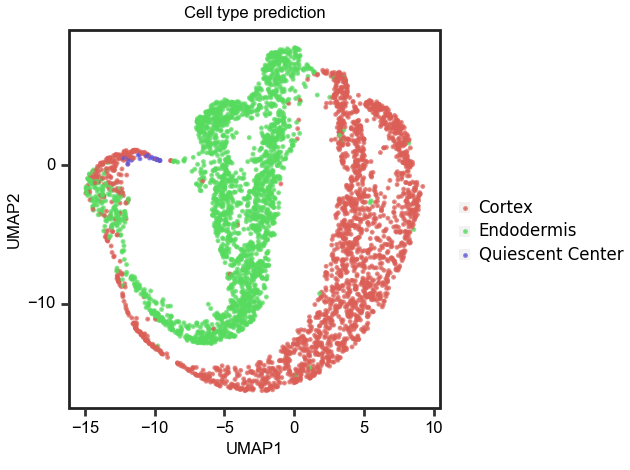

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.1500000000000004 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_cell_type_prediction_UMAP.pdf


In [205]:
#test cell type prediction

model=pickle.load(open("model/scGO_plant_cell_type.model","rb"))


#x_test=data_rm_sparse_subset.to_numpy()
#y_test=data_rm_sparse_subset.index.tolist()

y_test_relabeled=[label_dict[label] for label in y_test]



test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=5000, shuffle=False)
result=[]
y_prob=[]
#y_test=[]
for i, data in enumerate(test_loader):
    inputs, labels = data
        
    inputs=Variable(inputs).to(torch.float32)

    labels=Variable(labels).to(torch.long)
        
    #outputs,GO_sum,TF_derived_from_gene,GO_derived_from_TF = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF

    outputs = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF

    pred = list(torch.max(outputs, 1)[1].numpy())
    result.extend(pred)

    y_prob=outputs.detach().numpy()
    #y_test=list(labels.numpy())

pred=[label_dict_revese[label] for label in pred]


#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)

data=umap_test

data["prediction"]=pred

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(prediction)"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[2.35+0.8,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Cell type prediction")
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_cell_type_prediction_UMAP.pdf')


In [43]:
#gene id to gene symbol dict
gene_id_to_symbol_dict={}

with open("data/plant/Araport11_GFF3_genes_transposons.current.gff",encoding="latin-1") as f:
    for line in f:
        if line[0]=="#":
            continue
        
        try:
            type=line.split("\t")[2]
            if type!="gene":
                continue
            gene_id=line.split("ID=")[1].split(";")[0]
            gene_symbol=line.split("symbol=")[1].split(";")[0].rstrip()
            gene_id_to_symbol_dict[gene_id]=gene_symbol
        except:
            print(line)
            

Chr1	Araport11	gene	44970	47059	.	-	.	ID=AT1G01080;Name=AT1G01080;locus=2200975;locus_type=protein_coding

Chr1	Araport11	gene	49909	51210	.	-	.	ID=AT1G01100;Name=AT1G01100;Note=60S acidic ribosomal protein family;computational_description=60S acidic ribosomal protein family;locus=2200985;locus_type=protein_coding

Chr1	Araport11	gene	61905	63811	.	-	.	ID=AT1G01130;Name=AT1G01130;locus=2035357;locus_type=protein_coding

Chr1	Araport11	gene	69911	72138	.	-	.	ID=AT1G01150;Name=AT1G01150;locus=2035372;locus_type=protein_coding

Chr1	Araport11	gene	73931	74737	.	-	.	ID=AT1G01170;Name=AT1G01170;locus=2035247;locus_type=protein_coding

Chr1	Araport11	gene	75390	76845	.	+	.	ID=AT1G01180;Name=AT1G01180;locus=2035262;locus_type=protein_coding

Chr1	Araport11	gene	82984	84946	.	-	.	ID=AT1G01190;Name=AT1G01190;full_name=cytochrome P450, family 78, subfamily A, polypeptide 8;locus=2035282;locus_type=protein_coding

Chr1	Araport11	gene	88622	90502	.	+	.	ID=AT1G01210;Name=AT1G01210;locus=2035322;loc

In [44]:
gene_id_to_symbol_dict

{'AT1G01010': 'NAC001',
 'AT1G01020': 'ARV1',
 'AT1G01030': 'NGA3',
 'AT1G01040': 'DCL1',
 'AT1G01046': 'MIR838A',
 'AT1G01050': 'PPa1',
 'AT1G01060': 'LHY',
 'AT1G01070': 'UMAMIT28',
 'AT1G01090': 'PDH-E1 ALPHA',
 'AT1G01110': 'IQD18',
 'AT1G01120': 'KCS1',
 'AT1G01140': 'CIPK9',
 'AT1G01160': 'GIF2',
 'AT1G01183': 'MIR165A',
 'AT1G01200': 'RABA3',
 'AT1G01220': 'FKGP',
 'AT1G01280': 'CYP703A2',
 'AT1G01290': 'CNX3',
 'AT1G01340': 'CNGC10',
 'AT1G01360': 'RCAR1',
 'AT1G01370': 'HTR12',
 'AT1G01380': 'ETC1',
 'AT1G01410': 'PUM22',
 'AT1G01430': 'TBL25',
 'AT1G01460': 'PIPK11',
 'AT1G01470': 'LEA14',
 'AT1G01480': 'ACS2',
 'AT1G01510': 'AN',
 'AT1G01520': 'ASG4',
 'AT1G01530': 'AGL28',
 'AT1G01550': 'BPS1',
 'AT1G01560': 'MPK11',
 'AT1G01590': 'FRO1',
 'AT1G01600': 'CYP86A4',
 'AT1G01610': 'GPAT4',
 'AT1G01620': 'PIP1C',
 'AT1G01650': 'SPPL4',
 'AT1G01680': 'PUB54',
 'AT1G01690': 'PRD3',
 'AT1G01695': 'TRM33',
 'AT1G01720': 'ATAF1',
 'AT1G01740': 'BSK4',
 'AT1G01780': 'PLIM2b',
 'AT1G01

In [206]:
test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=4000, shuffle=False)

for i, batch in enumerate(test_loader):
    input, labels = batch
    
    input=Variable(input).to(torch.float32)
    break


for i,celltype in enumerate(classes):
    print(i,celltype,data_rm_sparse.index.to_list().count(celltype))

0 Cortex 11073
1 Endodermis 11369
2 Quiescent Center 158


In [225]:
# DeepLift

from captum.attr import DeepLift

model.eval()

dl = DeepLift(model)

baseline = torch.randn_like(input)

selected_genes=[]
feature_importance=[]

#for target in [5,1,2,7]:
for target in range(0,3):
    attributions, delta = dl.attribute(input, baseline, target=target, return_convergence_delta=True)



    attributions_mean = attributions.mean(dim=0)
    attributions_sum = attributions.sum(dim=0)

    gene_list=data_rm_sparse.columns

    top_indices = np.argsort(attributions_mean.detach().numpy())[::-1][:20]    #top 10 indices 
    for index in top_indices:
        selected_genes.append(gene_list[index])
        feature_importance.append(attributions_mean[index].detach().numpy())

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/attr/_core/deep_lift.py:322: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished


In [226]:
feature_importance
top_indices = np.argsort(feature_importance)[::-1][:150]

top_50_gene=[]
top_50_importance=[]

for index in top_indices:
    #print(selected_genes[index],feature_importance[index])
    if selected_genes[index] not in top_50_gene:
        top_50_gene.append(selected_genes[index])
        top_50_importance.append(float(feature_importance[index]))
    if len(top_50_gene)==150:
        break
    
top_50_gene

for gene in top_50_gene:
    print(gene,gene_id_to_symbol_dict.get(gene,"NA"))

AT2G36830 GAMMA-TIP
AT1G62480 NA
AT3G13520 AGP12
AT5G46900 NA
AT2G37170 NA
AT1G05260 RCI3
AT2G36100 CASP1
AT2G32300 NA
AT4G30170 NA
AT5G56540 AGP14
AT2G44790 UCC2
AT2G23120 NA
AT3G52930 FBA8
AT3G54400 NA
AT5G45130 NA
AT2G17420 NTRA
AT3G48140 NA
AT4G26320 AGP13
AT3G16240 DELTA-TIP
AT5G53300 UBC10
AT5G21940 NA
AT5G19110 NA
AT1G78380 GSTU19
AT4G13930 SHM4
AT1G76680 OPR1
AT1G21310 EXT3
AT3G53420 PIP2A
AT2G43150 NA
AT1G68440 NA
AT5G40730 AGP24
AT1G20450 ERD10
AT1G12090 ELP
AT5G19230 NA
AT1G78040 NA
AT1G55920 SERAT2
AT4G35100 PIP3
AT3G10985 SAG20
AT3G23810 SAHH2
AT5G02260 EXPA9
AT1G55360 NA
AT5G46890 NA
AT4G36500 NA
AT1G20190 EXPA11
AT2G37040 PAL1
AT1G11910 NA
AT1G76200 NA
AT1G70780 NA
AT3G08610 NA
AT3G44190 NA
AT3G20390 NA
AT2G18210 NA
AT1G75750 GASA1
AT5G20190 NA
AT3G23030 NA
AT3G13310 NA
AT3G01120 MTO1


In [227]:
len(top_50_gene)

56

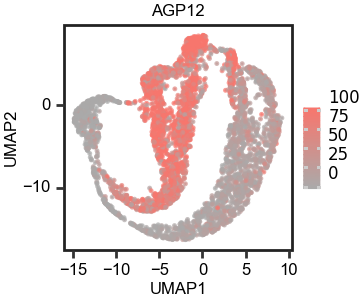

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 1.82 x 1.52 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_cell_type_marker_gene_AGP12.pdf


KeyboardInterrupt: 

In [95]:
#marker gene plot AGP12  :   AT3G13520




#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

marker_gene=data_rm_sparse["AT3G13520"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)
data=umap_test

marker_gene_train, marker_gene_test = ts(marker_gene,test_size=0.2,random_state=1, shuffle=True)

marker_gene_test[marker_gene_test>100]=100
#marker_gene_test[marker_gene_test<=0.01]=0

data["color"]=marker_gene_test.values

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="color"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[1.52+0.3,1.52],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("AGP12")
    #+scale_color_manual(values=['#AAAAAA', c1])  
    +scale_color_gradient(low = '#AAAAAA', high = "#F8766D") 
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_cell_type_marker_gene_AGP12.pdf')


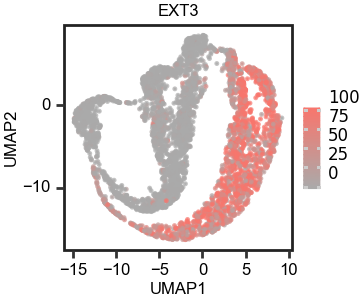

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 1.82 x 1.52 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_cell_type_marker_gene_EXT3.pdf


In [154]:
#marker gene plot EXT3  :   AT1G21310




#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

marker_gene=data_rm_sparse["AT1G21310"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)
data=umap_test

marker_gene_train, marker_gene_test = ts(marker_gene,test_size=0.2,random_state=1, shuffle=True)

marker_gene_test[marker_gene_test>100]=100
#marker_gene_test[marker_gene_test<=0.01]=0

data["color"]=marker_gene_test.values

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="color"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[1.52+0.3,1.52],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("EXT3")
    #+scale_color_manual(values=['#AAAAAA', c1])  
    +scale_color_gradient(low = '#AAAAAA', high = "#F8766D") 
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_cell_type_marker_gene_EXT3.pdf')


In [257]:
#violinplot

import numpy as np
import scanpy as sc
import pandas as pd

sc.settings.verbosity = 3

sc.settings.set_figure_params(dpi=80, facecolor='white')

results_file = 'data/test.h5ad'  # the file that will store the analysis results

#read csv file
adata = sc.read_csv('data/plant/ground_tissue_counts_cell_by_gene.csv', delimiter=',', first_column_names=True)

#read annotation file
adata.obs = pd.read_csv('data/plant/sc_ground_tissue_cell_type.csv', delimiter=',', index_col=0)


AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([1, 2], dtype='int64'), …


In [258]:
adata.obs

,x
1,Cortex
2,Cortex
3,Endodermis
4,Endodermis
5,Cortex
...,...
22596,Endodermis
22597,Cortex
22598,Endodermis
22599,Endodermis


In [259]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


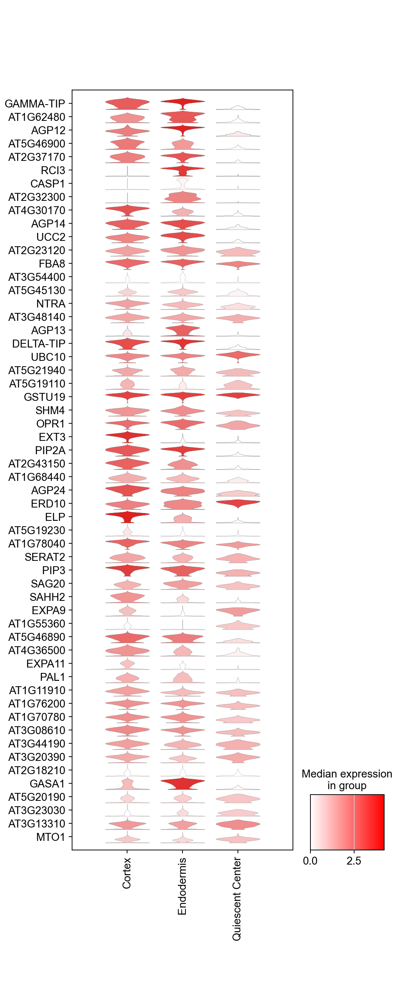

In [265]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
#import matplotlib.pyplot as plt
# Define a custom colormap that transitions from white to red
cmap = mcolors.LinearSegmentedColormap.from_list('custom', ['#FFFFFF', "#FF0000"])

#rename gene id to gene symbol
adata.var_names_make_unique()
adata.var.rename(index=gene_id_to_symbol_dict, inplace=True)

top_50_gene=[gene_id_to_symbol_dict.get(gene,gene) for gene in top_50_gene]

#sc.pl.stacked_violin(adata, top_50_gene, groupby='x',swap_axes=True,figsize=(6,15),cmap=cmap,save="plant_ground_tissue_cell_type_marker_genes_violinplot.pdf")
sc.pl.stacked_violin(adata, top_50_gene, groupby='x',swap_axes=True,figsize=(6,15),cmap=cmap)


svg_filename="figure/plant_ground_tissue_cell_type_marker_genes_violinplot.svg"
plt.savefig(svg_filename, format='svg', bbox_inches='tight')

# Show the plot (optional)


In [244]:
#rename gene id to gene symbol
adata.var.rename(index=gene_id_to_symbol_dict, inplace=True)

In [245]:
adata.var

""
NAC001
ARV1
AT1G03987
NGA3
DCL1
...
AT4G04815
AT4G08485
AT4G06380
ATDOF4.2


In [12]:
GO_sum=GO_sum.detach().numpy()
TF_derived_from_gene=TF_derived_from_gene.detach().numpy()
GO_derived_from_TF=GO_derived_from_TF.detach().numpy()

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/numba/core/typed_passes.py:313: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../.conda/envs/sc/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^



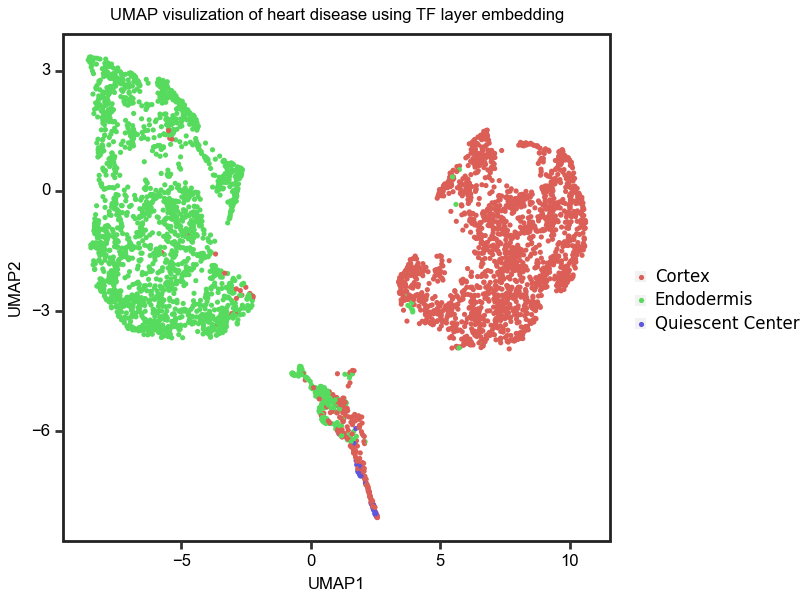

In [19]:
#embeding visualization

from plotnine import *
import pandas as pd
import umap

reducer=umap.UMAP(random_state=24)

embedding = reducer.fit_transform(TF_derived_from_gene)

black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data=pd.DataFrame(embedding)
data.columns=["UMAP1","UMAP2"]
data["label"]=y_test



p =(ggplot(aes(x='UMAP1', y='UMAP2',color='factor(label)'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2+1,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.35,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of heart disease using TF layer embedding")
    #+scale_fill_manual(values=[c1, c2, c3])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_GO_embedding_UMAP.pdf')

In [159]:
#developmental stage
#GO_Net

import math
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from sklearn.model_selection import train_test_split as ts


development_stage=pd.read_csv("data/plant/sc_ground_tissue_development_stage.csv",index_col=0)
label=development_stage["x"].to_list()
data_rm_sparse.index=label

###############################################################
gene_to_TF_transform_matrix=pickle.load(open("data/plant/gene_to_TF_transform_matrix","rb"))
TF_mask=pickle.load(open("data/plant/TF_mask","rb"))
GO_mask=pickle.load(open("data/plant/GO_mask","rb"))
GO_TF_mask=pickle.load(open("data/plant/GO_TF_mask","rb"))
###############################################################
#data_annotation = pd.read_csv('data/macparland/GSE115469_CellClusterType.txt', sep="\t")
#index_rename_dict = {key: value for key, value in zip(data_annotation['CellName'], data_annotation['CellType'])}
#$data_rm_sparse=data_rm_sparse.rename(index=index_rename_dict)

#normalize by row
#data_rm_sparse = data_rm_sparse.apply(lambda row: row / np.linalg.norm(row), axis=1)

#merge similar cell types
#data_rm_sparse.index = data_rm_sparse.index.str.replace('Hepatocyte_\d+', 'Hepatocyte', regex=True)
#data_rm_sparse.index = data_rm_sparse.index.str.replace('gamma-delta_T_Cells_\d+', 'gamma-delta_T_Cells', regex=True)


#filter low count cells
#data_rm_sparse = data_rm_sparse[data_rm_sparse.index != 'Hepatic_Stellate_Cells']


#novel_cell_type = ['Plasma_Cells']

#data_rm_sparse_novel = data_rm_sparse[data_rm_sparse.index.isin(novel_cell_type)]
#data_rm_sparse_rest = data_rm_sparse[~data_rm_sparse.index.isin(novel_cell_type)]




classes=[]
for celltype in data_rm_sparse.index:
    if celltype not in classes:
        classes.append(celltype)
#print(len(classes),classes)


label_dict_revese={}
label_dict={}
for i,celltype in enumerate(classes):
    label_dict[celltype]=i
    label_dict_revese[i]=celltype
label_dict
################################################################



def gen_mask(row,col,percent=0.5,num_zeros=None):
    if num_zeros is None:
        #Total number being masked is 0.5 by default
        num_zeros=int((row*col)*percent)
    
    mask=np.hstack([np.zeros(num_zeros),np.ones(row*col-num_zeros)])
    np.random.shuffle(mask)
    return mask.reshape(row,col)

class LinearFunction(torch.autograd.Function):
    """
    autograd function which masks it's weights by 'mask'.
    """
    
    #Not that both forward and backword are @staticmethod

    
    #bias, mask is an optional argument
    @staticmethod
    def forward(ctx, input, weight, bias=None, mask=None):
        if mask is not None:
            #change weight to 0 where mask == 0

            weight=weight*mask
 
        output=input.mm(weight.t())

        if bias is not None:
            output+=bias.unsqueeze(0).expand_as(output)
        
        ctx.save_for_backward(input, weight, bias, mask)

        return output
    
    #This function has noly a single output, so it gets only one gradient
    @staticmethod
    def backward(ctx,grad_output):
        input,weight,bias,mask = ctx.saved_tensors
        grad_input=grad_weight=grad_bias=grad_mask=None
        
        #These meeds_input_grad checks are optional and there only to improve efficiency.
        #If you want to make your code simpler, you can skip them. Returning gradients for
        #inputs that don't require it is not an error.
        if ctx.needs_input_grad[0]:
            grad_input=grad_output.mm(weight)
        
        if ctx.needs_input_grad[1]:
            grad_weight=grad_output.t().mm(input)
            
            if mask is not None:
                
                #change grad_weight to 0 where mask == 0
                grad_weight=grad_weight*mask

        
        #if bias is not None and ctx.need_input_grad[2]:
        if ctx.needs_input_grad[2]:
            grad_bias=grad_output.sum(0).squeeze(0)
        
        return grad_input,grad_weight,grad_bias,grad_mask
    

       
class CustomizedLinear(nn.Module):
    def __init__(self,input_features,output_features, bias=None, mask=None):
        """
        Arguments
        mask [numpy array]:
            The shape is (n_input_fearues,n_output_features).
            The elements are 0 or 1 which delcare un-connected or connected.
            
        bias [bool]:
            flg of bias.
        """
        super(CustomizedLinear,self).__init__()
        self.input_features=input_features
        self.out_features=output_features
        
        #nn.Parameter is a spetial kind of Tensor, that will get
        #automatically registered as Module's parameter once it's assigned
        #as an attribute
        self.weight=nn.Parameter(torch.Tensor(self.out_features,self.input_features))
        
        if bias:

            self.bias=nn.Parameter(torch.Tensor(self.out_features))
        else:
            #You should always register all possible parameters, but the
            #optinal ones can be None if you want.
            self.register_parameter("bias",None)
            
        #Initialize the above parameters (weight and bias). Important!
        self.init_params()
        
        #mask should be registered after weight and bias
        if mask is not None:
            mask=torch.tensor(mask,dtype=torch.float).t()
            self.mask=nn.Parameter(mask,requires_grad=False)
        else:
            self.register_parameter("mask",None)

        
    def init_params(self):
        stdv=1./math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv,stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv,stdv)
                
    def forward(self,input):
        #See the autograd section for explanation of what happens here.
        
        output=LinearFunction.apply(input,self.weight,self.bias,self.mask)
        
        return output
        
    def extra_repr(self):
        #(Optional) Set the extra informatioin about this module. You can test
        #it by printing an object of this class.
        return "input_features={}, output_features={}, bias={}, mask={}".format(
            self.input_features, self.out_features,
            self.bias is not None, self.mask is not None)
        
        
class GO_Net(nn.Module):
    def __init__(self,in_size,out_size,ratio=[0.006525,0,0]):
        super(GO_Net,self).__init__()

        self.gene_number=len(gene_expressed_cell_number.index.tolist())    #6033
        self.TF_number=len(TF_gene_dict)   
        self.GO_number=len(GO_list)
        self.class_number=3

        self.gene_to_TF_transform_matrix=torch.tensor(gene_to_TF_transform_matrix,dtype=torch.float32)
        
        
        
        self.bn0=nn.BatchNorm1d(self.gene_number)
        #self.fc1=CustomizedLinear(in_size,2290,mask=gen_mask(3443,2290,ratio[0]))  
        #self.fc1=CustomizedLinear(in_size,1946,mask=gen_mask(2903,1946,ratio[0]))        
        self.fc1=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        self.gene_to_GO_layer=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        #self.fc1=CustomizedLinear(in_size,2290,mask=np.ones((3443,2290)))
    
        self.bn1=nn.BatchNorm1d(self.GO_number)
                
        self.fc2=CustomizedLinear(self.GO_number,out_size,mask=gen_mask(self.GO_number,out_size,ratio[1]))
        self.bn2=nn.BatchNorm1d(out_size)

        self.gene_to_TF_layer=CustomizedLinear(self.gene_number,self.TF_number,mask=TF_mask)
        self.TF_to_GO_layer=CustomizedLinear(self.TF_number,self.GO_number,mask=GO_TF_mask)
        
        self.fc3=CustomizedLinear(100,100,mask=gen_mask(100,100,ratio[1]))

        self.fc4=CustomizedLinear(100,out_size,mask=gen_mask(100,out_size,ratio[1]))
        
        self.relu=nn.ReLU()
        self.leaky_relu=nn.LeakyReLU()
        #self.dropout = nn.Dropout(0.1)
        for module in self.modules():
            if isinstance(module,nn.Linear):
                nn.init.uniform_(module.weight,a=0,b=1)
            elif isinstance(module,(nn.BatchNorm1d,nn.GroupNorm)):
                nn.init.constant_(module.weight,1)
                nn.init.constant_(module.bias,0)

                        
    def forward(self,x):

        #x=self.bn0(x)
        TF_residul=torch.matmul(x,self.gene_to_TF_transform_matrix)

        TF_derived_from_gene=self.gene_to_TF_layer(x)

        TF_sum=TF_residul+TF_derived_from_gene
        #TF_sum=TF_derived_from_gene

        GO_derived_from_TF=self.TF_to_GO_layer(TF_sum)

        GO_derived_from_gene=self.gene_to_GO_layer(x)

        GO_sum=GO_derived_from_TF+GO_derived_from_gene

        #x=self.bn0(x)
        #x=self.fc1(x)
        #x=self.bn1(x)
        #x=self.relu(x)
        #x=self.dropout(x)
        GO_sum=self.leaky_relu(GO_sum)

        #x=torch.tanh(x) 
        #print(161,self.fc1.weight)
        x=self.fc2(GO_sum)
        #x=self.bn2(x)
        #x=self.relu(x)
        #x=self.leaky_relu(x)
        #x=self.fc3(x)
        #x=self.leaky_relu(x)
        #x=self.fc4(x)
        return x
        return x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    
class Reconstraction(nn.Module):
    def __init__(self,in_size,out_size):
        super(Reconstraction,self).__init__()

        self.decoder = nn.Sequential(
            nn.Linear(in_size, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 1000),
            nn.LeakyReLU(True),
            nn.Linear(1000, out_size)
        )

    def forward(self, x):
        x = self.decoder(x)
        return x
    


 
class MyDataset(Dataset):
    def __init__(self, x,y):
        self.x=x
        self.y=y

    def __getitem__(self, index):
        features = self.x[index]
        label = self.y[index]
        return features, label

    def __len__(self):
        return len(self.x)

def accuracy_score(y_test,y_pred):
    t=0
    f=0
    for i in range(len(y_test)):
        if y_test[i]==y_pred[i]:
            t+=1
        else:
            f+=1
    return(t/(t+f))


#training
input_size = len(data_rm_sparse.columns)
output_size = len(classes)

learning_rate = 0.1
epochs = 3

model = GO_Net(input_size, output_size,ratio=[0,0,0])

reconstraction_model=Reconstraction(len(classes),len(data_rm_sparse.columns))


"""
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

x = torch.randn(10, input_size)
y = torch.randn(10, output_size)

for i in range(epochs):
    optimizer.zero_grad()
    output = model(x)

    loss = criterion(output, y)
    loss.backward()
    optimizer.step()
"""
# define loss function and optimizer

optimizer = optim.Adam(model.parameters(), lr=0.001)
reconstraction_optimizer = optim.Adam(reconstraction_model.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()
reconstraction_criterion = nn.MSELoss()



data_train_x=data_rm_sparse
data_train_y=data_rm_sparse.index
#x_train,x_test,y_train,y_test,train_barcodes,test_barcodes = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),data_annotation["CellName"],test_size=0.2,random_state=1, shuffle=True)
x_train,x_test,y_train,y_test = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),test_size=0.2,random_state=1, shuffle=True)

#x_train=x_train[0:400]
#y_train=y_train[0:400]

#label_dict={25:0,26:1,27:2,33:3,34:4}
y_train_relabeled=[label_dict[label] for label in y_train]
y_test_relabeled=[label_dict[label] for label in y_test]


#train_size=20000

#x_train=x_train[0:train_size]
#y_train_relabeled=y_train_relabeled[0:train_size]

train_data=MyDataset(x_train,y_train_relabeled)
train_loader=DataLoader(train_data, batch_size=60, shuffle=True)

num_epochs=50
# 训练模型
for epoch in range(num_epochs):
    running_loss = 0.0
    reconstraction_running_loss = 0.0

    for i, data in enumerate(train_loader, 0):
        inputs, labels = data
        #print(labels)
        inputs=Variable(inputs).to(torch.float32)
        labels=Variable(labels).to(torch.long)
        # 将梯度缓存清零
        optimizer.zero_grad()

        # 前向传播、计算损失和反向传播
        outputs = model(inputs)

        loss = criterion(outputs, labels)


        #reconstraction
        

        #reconstraction_input=reconstraction_model(outputs)
        #reconstraction_loss = reconstraction_criterion(reconstraction_input, inputs)

        #reconstraction_optimizer.zero_grad()

        #combined_loss=loss+reconstraction_loss
        #combined_loss.backward()
        loss.backward()
    
        optimizer.step()
        #reconstraction_optimizer.step()


        #reconstraction_running_loss += reconstraction_loss.item()
        running_loss += loss.item()

        if i % 40 == 0:
            pass
            #print(i)
            #print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss / 200))
        
        if i>400:
            break

    test_data=MyDataset(x_test,y_test_relabeled)
    test_loader=DataLoader(test_data, batch_size=32, shuffle=False)
    result=[]
    for i, data in enumerate(test_loader):
        inputs, labels = data
        
        inputs=Variable(inputs).to(torch.float32)

        labels=Variable(labels).to(torch.long)
        
        outputs = model(inputs)
        pred = list(torch.max(outputs, 1)[1].numpy())
        result.extend(pred)
        #print(pred,labels)
        if i>100:
            break
    accuracy = accuracy_score(y_test_relabeled[0:len(result)],result)
        
            #########
    print(epoch," accuracy:\t",accuracy," loss:\t",running_loss / len(train_loader)," \treconstraction_loss:\t",reconstraction_running_loss / len(train_loader))
    
    #save model

    pickle.dump(model,open("model/scGO_plant_development_stage_model.pkl","wb"))
    


0  accuracy:	 0.9390318627450981  loss:	 0.2191499825320299  	reconstraction_loss:	 0.0
1  accuracy:	 0.9454656862745098  loss:	 0.13224471279031394  	reconstraction_loss:	 0.0
2  accuracy:	 0.9448529411764706  loss:	 0.10444056736120325  	reconstraction_loss:	 0.0
3  accuracy:	 0.9463848039215687  loss:	 0.08323047126624857  	reconstraction_loss:	 0.0
4  accuracy:	 0.9479166666666666  loss:	 0.07050200705323985  	reconstraction_loss:	 0.0
5  accuracy:	 0.9439338235294118  loss:	 0.06248480408600476  	reconstraction_loss:	 0.0


KeyboardInterrupt: 

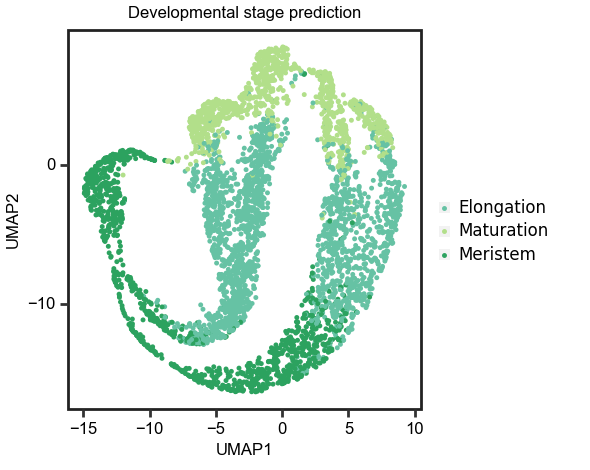

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 2.95 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_developmental_stage_prediction_UMAP.pdf


In [156]:
#test developmental stage prediction

model=pickle.load(open("model/scGO_plant_development_stage_model.pkl","rb"))


#x_test=data_rm_sparse_subset.to_numpy()
#y_test=data_rm_sparse_subset.index.tolist()

y_test_relabeled=[label_dict[label] for label in y_test]



test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=5000, shuffle=False)
result=[]
y_prob=[]
#y_test=[]
for i, data in enumerate(test_loader):
    inputs, labels = data
        
    inputs=Variable(inputs).to(torch.float32)

    labels=Variable(labels).to(torch.long)
        
    outputs,GO_sum,TF_derived_from_gene,GO_derived_from_TF = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    pred = list(torch.max(outputs, 1)[1].numpy())
    result.extend(pred)

    y_prob=outputs.detach().numpy()
    #y_test=list(labels.numpy())

pred=[label_dict_revese[label] for label in pred]


#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)

data=umap_test

data["prediction"]=pred

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(prediction)"))
    + geom_point(size=0.001,alpha=1)
    +theme(
        figure_size=[2.35+0.6,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Developmental stage prediction")
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
    +scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_developmental_stage_prediction_UMAP.pdf')


In [160]:
#DeepLIFT

test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=4000, shuffle=False)

for i, batch in enumerate(test_loader):
    input, labels = batch
    
    input=Variable(input).to(torch.float32)
    break


for i,celltype in enumerate(classes):
    print(i,celltype,data_rm_sparse.index.to_list().count(celltype))

0 Elongation 11130
1 Maturation 5295
2 Meristem 6175


In [161]:
# DeepLift

from captum.attr import DeepLift

model.eval()

dl = DeepLift(model)

baseline = torch.randn_like(input)

selected_genes=[]
feature_importance=[]

#for target in [5,1,2,7]:
for target in range(0,3):
    attributions, delta = dl.attribute(input, baseline, target=target, return_convergence_delta=True)



    attributions_mean = attributions.mean(dim=0)
    attributions_sum = attributions.sum(dim=0)

    gene_list=data_rm_sparse.columns

    top_indices = np.argsort(attributions_mean.detach().numpy())[::-1][:50]    #top 10 indices 
    for index in top_indices:
        selected_genes.append(gene_list[index])
        feature_importance.append(attributions_mean[index].detach().numpy())

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/attr/_core/deep_lift.py:322: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished


In [162]:
feature_importance
top_indices = np.argsort(feature_importance)[::-1][:150]

top_50_gene=[]
top_50_importance=[]

for index in top_indices:
    #print(selected_genes[index],feature_importance[index])
    if selected_genes[index] not in top_50_gene:
        top_50_gene.append(selected_genes[index])
        top_50_importance.append(float(feature_importance[index]))
    if len(top_50_gene)==150:
        break
    
top_50_gene

for gene in top_50_gene:
    print(gene,gene_id_to_symbol_dict.get(gene,"NA"))

AT5G46890 NA
AT5G46900 NA
AT2G43150 NA
AT2G44790 UCC2
AT5G15230 GASA4
AT3G56240 CCH
AT5G56540 AGP14
AT3G16240 DELTA-TIP
AT2G36830 GAMMA-TIP
AT3G26520 TIP2
AT4G35100 PIP3
AT1G55210 NA
AT5G53300 UBC10
AT1G75750 GASA1
AT4G26320 AGP13
AT3G08580 AAC1
AT1G12090 ELP
AT3G13520 AGP12
AT2G37170 NA
AT4G11290 NA
AT1G76090 SMT3
AT1G62480 NA
AT3G53420 PIP2A
AT3G55440 TPI
AT4G34050 NA
AT1G21310 EXT3
AT2G21660 CCR2
AT2G15970 COR413-PM1
AT2G30870 GSTF10
AT5G40450 NA
AT5G40730 AGP24
AT1G09070 SRC2
AT3G13920 NA
AT1G20440 COR47
AT4G05320 UBQ10
AT5G13930 TT4
AT1G05260 RCI3
AT4G36990 HSF4
AT1G65980 TPX1
AT2G41430 ERD15
AT1G04410 c-NAD-MDH1
AT1G76680 OPR1
AT4G13940 HOG1
AT4G21850 MSRB9
AT1G20190 EXPA11
AT1G74840 NA
AT1G01620 PIP1C
AT1G61890 NA
AT1G23440 NA
AT1G55330 AGP21
AT4G12520 NA
AT2G31390 NA
AT3G60450 NA
AT5G65207 NA
AT4G29350 PFN2
AT1G55920 SERAT2
AT3G23810 SAHH2
AT3G56880 NA
AT3G01190 NA
AT5G19440 NA
AT4G20150 NA
AT1G03870 FLA9
AT3G49780 PSK4
AT4G16380 NA
AT3G06420 ATG8H
AT3G14310 PME3
AT3G22890 APS1

In [163]:
#violinplot

import numpy as np
import scanpy as sc
import pandas as pd

sc.settings.verbosity = 3

sc.settings.set_figure_params(dpi=80, facecolor='white')

results_file = 'data/test.h5ad'  # the file that will store the analysis results

#read csv file
adata = sc.read_csv('data/plant/ground_tissue_counts_cell_by_gene.csv', delimiter=',', first_column_names=True)

#read annotation file
adata.obs = pd.read_csv('data/plant/sc_ground_tissue_development_stage.csv', delimiter=',', index_col=0)

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([1, 2], dtype='int64'), …


In [164]:
adata.obs

,x
1,Elongation
2,Maturation
3,Elongation
4,Elongation
5,Elongation
...,...
22596,Meristem
22597,Meristem
22598,Meristem
22599,Elongation


In [165]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
... storing 'x' as categorical


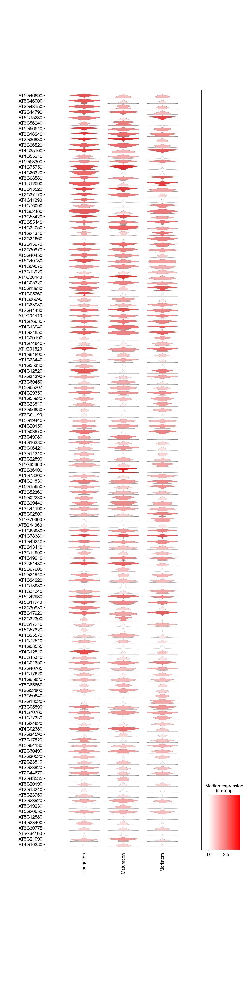

In [166]:
import matplotlib.colors as mcolors
# Define a custom colormap that transitions from white to red
cmap = mcolors.LinearSegmentedColormap.from_list('custom', ['#FFFFFF', "#FF0000"])



sc.pl.stacked_violin(adata, top_50_gene, groupby='x',swap_axes=True,figsize=(9,36),cmap=cmap)

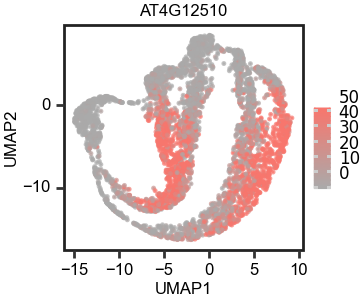

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 1.82 x 1.52 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_cell_type_marker_gene_AT4G12510.pdf


In [177]:
#marker gene plot EXT3  :   AT1G21310




#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

marker_gene=data_rm_sparse["AT4G12510"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)
data=umap_test

marker_gene_train, marker_gene_test = ts(marker_gene,test_size=0.2,random_state=1, shuffle=True)

marker_gene_test[marker_gene_test>50]=50
#marker_gene_test[marker_gene_test<=0.01]=0

data["color"]=marker_gene_test.values

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="color"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[1.52+0.3,1.52],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("AT4G12510")
    #+scale_color_manual(values=['#AAAAAA', c1])  
    +scale_color_gradient(low = '#AAAAAA', high = "#F8766D") 
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_cell_type_marker_gene_AT4G12510.pdf')


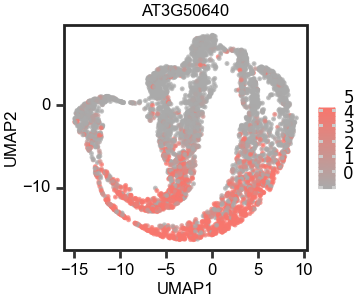

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 1.82 x 1.52 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_cell_type_marker_gene_AT3G50640.pdf


In [199]:
#marker gene plot EXT3  :   AT1G21310




#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

marker_gene=data_rm_sparse["AT3G50640"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)
data=umap_test

marker_gene_train, marker_gene_test = ts(marker_gene,test_size=0.2,random_state=1, shuffle=True)

marker_gene_test[marker_gene_test>5]=5
#marker_gene_test[marker_gene_test<=0.01]=0

data["color"]=marker_gene_test.values

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="color"))
    + geom_point(size=0.001,alpha=0.7)
    +theme(
        figure_size=[1.52+0.3,1.52],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("AT3G50640")
    #+scale_color_manual(values=['#AAAAAA', c1])  
    +scale_color_gradient(low = '#AAAAAA', high = "#F8766D") 
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_cell_type_marker_gene_AT3G50640.pdf')


In [48]:
GO_sum=GO_sum.detach().numpy()
TF_derived_from_gene=TF_derived_from_gene.detach().numpy()
GO_derived_from_TF=GO_derived_from_TF.detach().numpy()


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../.conda/envs/sc/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^



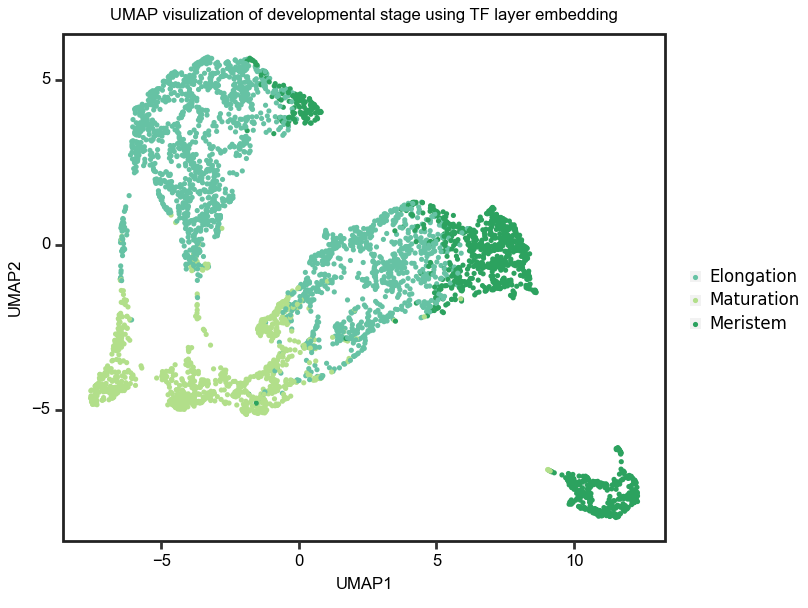

In [52]:
#embeding visualization

from plotnine import *
import pandas as pd
import umap

reducer=umap.UMAP(random_state=24)

embedding = reducer.fit_transform(TF_derived_from_gene)

black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data=pd.DataFrame(embedding)
data.columns=["UMAP1","UMAP2"]
data["label"]=y_test



p =(ggplot(aes(x='UMAP1', y='UMAP2',color='factor(label)'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2+1,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.35,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of developmental stage using TF layer embedding")
    #+scale_fill_manual(values=[c1, c2, c3])  
    +scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_GO_embedding_UMAP.pdf')


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../.conda/envs/sc/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^



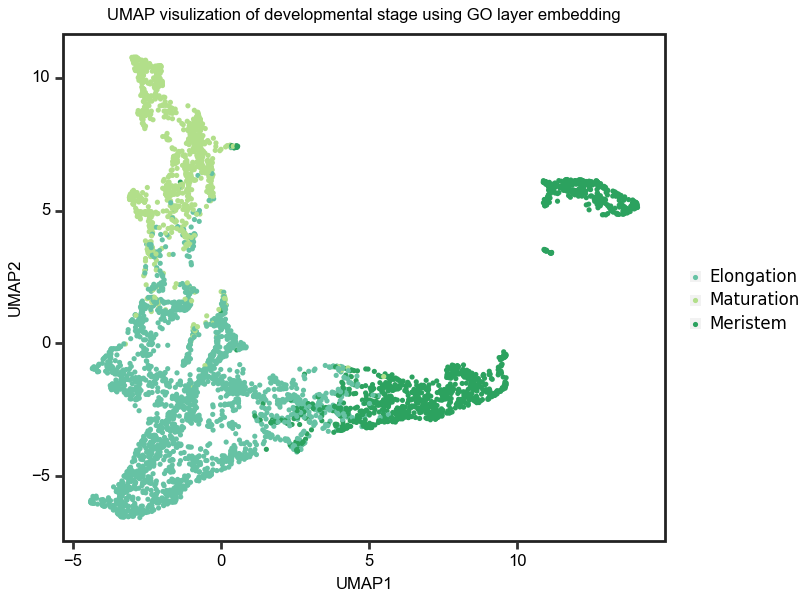

In [53]:
#embeding visualization

from plotnine import *
import pandas as pd
import umap

reducer=umap.UMAP(random_state=24)

embedding = reducer.fit_transform(GO_sum)

black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data=pd.DataFrame(embedding)
data.columns=["UMAP1","UMAP2"]
data["label"]=y_test



p =(ggplot(aes(x='UMAP1', y='UMAP2',color='factor(label)'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2+1,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.35,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of developmental stage using GO layer embedding")
    #+scale_fill_manual(values=[c1, c2, c3])  
    +scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_GO_embedding_UMAP.pdf')

In [149]:
#pseudotime
#GO_Net

import math
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from sklearn.model_selection import train_test_split as ts


pseudotime=pd.read_csv("data/plant/sc_ground_tissue_pseudotime.csv",index_col=0)
label=pseudotime["x"].to_list()
data_rm_sparse.index=label

###############################################################
gene_to_TF_transform_matrix=pickle.load(open("data/plant/gene_to_TF_transform_matrix","rb"))
TF_mask=pickle.load(open("data/plant/TF_mask","rb"))
GO_mask=pickle.load(open("data/plant/GO_mask","rb"))
GO_TF_mask=pickle.load(open("data/plant/GO_TF_mask","rb"))
###############################################################
#data_annotation = pd.read_csv('data/macparland/GSE115469_CellClusterType.txt', sep="\t")
#index_rename_dict = {key: value for key, value in zip(data_annotation['CellName'], data_annotation['CellType'])}
#$data_rm_sparse=data_rm_sparse.rename(index=index_rename_dict)

#normalize by row
#data_rm_sparse = data_rm_sparse.apply(lambda row: row / np.linalg.norm(row), axis=1)

#merge similar cell types
#data_rm_sparse.index = data_rm_sparse.index.str.replace('Hepatocyte_\d+', 'Hepatocyte', regex=True)
#data_rm_sparse.index = data_rm_sparse.index.str.replace('gamma-delta_T_Cells_\d+', 'gamma-delta_T_Cells', regex=True)


#filter low count cells
#data_rm_sparse = data_rm_sparse[data_rm_sparse.index != 'Hepatic_Stellate_Cells']


#novel_cell_type = ['Plasma_Cells']

#data_rm_sparse_novel = data_rm_sparse[data_rm_sparse.index.isin(novel_cell_type)]
#data_rm_sparse_rest = data_rm_sparse[~data_rm_sparse.index.isin(novel_cell_type)]




classes=[]
for celltype in data_rm_sparse.index:
    if celltype not in classes:
        classes.append(celltype)
#print(len(classes),classes)


label_dict_revese={}
label_dict={}
for i,celltype in enumerate(classes):
    label_dict[celltype]=i
    label_dict_revese[i]=celltype
label_dict
################################################################



def gen_mask(row,col,percent=0.5,num_zeros=None):
    if num_zeros is None:
        #Total number being masked is 0.5 by default
        num_zeros=int((row*col)*percent)
    
    mask=np.hstack([np.zeros(num_zeros),np.ones(row*col-num_zeros)])
    np.random.shuffle(mask)
    return mask.reshape(row,col)

class LinearFunction(torch.autograd.Function):
    """
    autograd function which masks it's weights by 'mask'.
    """
    
    #Not that both forward and backword are @staticmethod

    
    #bias, mask is an optional argument
    @staticmethod
    def forward(ctx, input, weight, bias=None, mask=None):
        if mask is not None:
            #change weight to 0 where mask == 0

            weight=weight*mask
 
        output=input.mm(weight.t())

        if bias is not None:
            output+=bias.unsqueeze(0).expand_as(output)
        
        ctx.save_for_backward(input, weight, bias, mask)

        return output
    
    #This function has noly a single output, so it gets only one gradient
    @staticmethod
    def backward(ctx,grad_output):
        input,weight,bias,mask = ctx.saved_tensors
        grad_input=grad_weight=grad_bias=grad_mask=None
        
        #These meeds_input_grad checks are optional and there only to improve efficiency.
        #If you want to make your code simpler, you can skip them. Returning gradients for
        #inputs that don't require it is not an error.
        if ctx.needs_input_grad[0]:
            grad_input=grad_output.mm(weight)
        
        if ctx.needs_input_grad[1]:
            grad_weight=grad_output.t().mm(input)
            
            if mask is not None:
                
                #change grad_weight to 0 where mask == 0
                grad_weight=grad_weight*mask

        
        #if bias is not None and ctx.need_input_grad[2]:
        if ctx.needs_input_grad[2]:
            grad_bias=grad_output.sum(0).squeeze(0)
        
        return grad_input,grad_weight,grad_bias,grad_mask
    

       
class CustomizedLinear(nn.Module):
    def __init__(self,input_features,output_features, bias=None, mask=None):
        """
        Arguments
        mask [numpy array]:
            The shape is (n_input_fearues,n_output_features).
            The elements are 0 or 1 which delcare un-connected or connected.
            
        bias [bool]:
            flg of bias.
        """
        super(CustomizedLinear,self).__init__()
        self.input_features=input_features
        self.out_features=output_features
        
        #nn.Parameter is a spetial kind of Tensor, that will get
        #automatically registered as Module's parameter once it's assigned
        #as an attribute
        self.weight=nn.Parameter(torch.Tensor(self.out_features,self.input_features))
        
        if bias:

            self.bias=nn.Parameter(torch.Tensor(self.out_features))
        else:
            #You should always register all possible parameters, but the
            #optinal ones can be None if you want.
            self.register_parameter("bias",None)
            
        #Initialize the above parameters (weight and bias). Important!
        self.init_params()
        
        #mask should be registered after weight and bias
        if mask is not None:
            mask=torch.tensor(mask,dtype=torch.float).t()
            self.mask=nn.Parameter(mask,requires_grad=False)
        else:
            self.register_parameter("mask",None)

        
    def init_params(self):
        stdv=1./math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv,stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv,stdv)
                
    def forward(self,input):
        #See the autograd section for explanation of what happens here.
        
        output=LinearFunction.apply(input,self.weight,self.bias,self.mask)
        
        return output
        
    def extra_repr(self):
        #(Optional) Set the extra informatioin about this module. You can test
        #it by printing an object of this class.
        return "input_features={}, output_features={}, bias={}, mask={}".format(
            self.input_features, self.out_features,
            self.bias is not None, self.mask is not None)
        
        
class GO_Net(nn.Module):
    def __init__(self,in_size,out_size,ratio=[0.006525,0,0]):
        super(GO_Net,self).__init__()

        self.gene_number=len(gene_expressed_cell_number.index.tolist())    #6033
        self.TF_number=len(TF_gene_dict)   
        self.GO_number=len(GO_list)
        self.class_number=3

        self.gene_to_TF_transform_matrix=torch.tensor(gene_to_TF_transform_matrix,dtype=torch.float32)
        
        
        
        self.bn0=nn.BatchNorm1d(self.gene_number)
        #self.fc1=CustomizedLinear(in_size,2290,mask=gen_mask(3443,2290,ratio[0]))  
        #self.fc1=CustomizedLinear(in_size,1946,mask=gen_mask(2903,1946,ratio[0]))        
        self.fc1=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        self.gene_to_GO_layer=CustomizedLinear(in_size,self.GO_number,mask=GO_mask)    #GO_term
        #self.fc1=CustomizedLinear(in_size,2290,mask=np.ones((3443,2290)))
    
        self.bn1=nn.BatchNorm1d(self.GO_number)
                
        self.fc2=CustomizedLinear(self.GO_number,out_size,mask=gen_mask(self.GO_number,out_size,ratio[1]))
        self.bn2=nn.BatchNorm1d(out_size)

        self.gene_to_TF_layer=CustomizedLinear(self.gene_number,self.TF_number,mask=TF_mask)
        self.TF_to_GO_layer=CustomizedLinear(self.TF_number,self.GO_number,mask=GO_TF_mask)
        
        self.fc3=CustomizedLinear(100,100,mask=gen_mask(100,100,ratio[1]))

        self.fc4=CustomizedLinear(100,out_size,mask=gen_mask(100,out_size,ratio[1]))
        
        self.relu=nn.ReLU()
        self.leaky_relu=nn.LeakyReLU()
        #self.dropout = nn.Dropout(0.1)
        for module in self.modules():
            if isinstance(module,nn.Linear):
                nn.init.uniform_(module.weight,a=0,b=1)
            elif isinstance(module,(nn.BatchNorm1d,nn.GroupNorm)):
                nn.init.constant_(module.weight,1)
                nn.init.constant_(module.bias,0)

                        
    def forward(self,x):

        #x=self.bn0(x)
        TF_residul=torch.matmul(x,self.gene_to_TF_transform_matrix)

        TF_derived_from_gene=self.gene_to_TF_layer(x)

        TF_sum=TF_residul+TF_derived_from_gene
        #TF_sum=TF_derived_from_gene

        GO_derived_from_TF=self.TF_to_GO_layer(TF_sum)

        GO_derived_from_gene=self.gene_to_GO_layer(x)

        GO_sum=GO_derived_from_TF+GO_derived_from_gene

        #x=self.bn0(x)
        #x=self.fc1(x)
        #x=self.bn1(x)
        #x=self.relu(x)
        #x=self.dropout(x)
        GO_sum=self.leaky_relu(GO_sum)

        #x=torch.tanh(x) 
        #print(161,self.fc1.weight)
        x=self.fc2(GO_sum)
        #x=self.bn2(x)
        #x=self.relu(x)
        #x=self.leaky_relu(x)
        #x=self.fc3(x)
        #x=self.leaky_relu(x)
        #x=self.fc4(x)
 
        return x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    
class Reconstraction(nn.Module):
    def __init__(self,in_size,out_size):
        super(Reconstraction,self).__init__()

        self.decoder = nn.Sequential(
            nn.Linear(in_size, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 500),
            nn.LeakyReLU(True),
            nn.Linear(500, 1000),
            nn.LeakyReLU(True),
            nn.Linear(1000, out_size)
        )

    def forward(self, x):
        x = self.decoder(x)
        return x
    


 
class MyDataset(Dataset):
    def __init__(self, x,y):
        self.x=x
        self.y=y

    def __getitem__(self, index):
        features = self.x[index]
        label = self.y[index]
        return features, label

    def __len__(self):
        return len(self.x)

def accuracy_score(y_test,y_pred):
    t=0
    f=0
    for i in range(len(y_test)):
        if y_test[i]==y_pred[i]:
            t+=1
        else:
            f+=1
    return(t/(t+f))


#training
input_size = len(data_rm_sparse.columns)
output_size = len(classes)

learning_rate = 0.1
epochs = 3

model = GO_Net(input_size, output_size,ratio=[0,0,0])

reconstraction_model=Reconstraction(len(classes),len(data_rm_sparse.columns))


"""
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

x = torch.randn(10, input_size)
y = torch.randn(10, output_size)

for i in range(epochs):
    optimizer.zero_grad()
    output = model(x)

    loss = criterion(output, y)
    loss.backward()
    optimizer.step()
"""
# define loss function and optimizer

optimizer = optim.Adam(model.parameters(), lr=0.001)
reconstraction_optimizer = optim.Adam(reconstraction_model.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()
reconstraction_criterion = nn.MSELoss()



data_train_x=data_rm_sparse
data_train_y=data_rm_sparse.index
#x_train,x_test,y_train,y_test,train_barcodes,test_barcodes = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),data_annotation["CellName"],test_size=0.2,random_state=1, shuffle=True)
x_train,x_test,y_train,y_test = ts(data_train_x.to_numpy(),data_train_y.to_numpy(),test_size=0.2,random_state=1, shuffle=True)

#x_train=x_train[0:400]
#y_train=y_train[0:400]

#label_dict={25:0,26:1,27:2,33:3,34:4}
y_train_relabeled=[label_dict[label] for label in y_train]
y_test_relabeled=[label_dict[label] for label in y_test]


#train_size=20000

#x_train=x_train[0:train_size]
#y_train_relabeled=y_train_relabeled[0:train_size]

train_data=MyDataset(x_train,y_train_relabeled)
train_loader=DataLoader(train_data, batch_size=60, shuffle=True)

num_epochs=50
# 训练模型
for epoch in range(num_epochs):
    running_loss = 0.0
    reconstraction_running_loss = 0.0

    for i, data in enumerate(train_loader, 0):
        inputs, labels = data
        #print(labels)
        inputs=Variable(inputs).to(torch.float32)
        labels=Variable(labels).to(torch.long)
        # 将梯度缓存清零
        optimizer.zero_grad()

        # 前向传播、计算损失和反向传播
        outputs,_,_,_ = model(inputs)

        loss = criterion(outputs, labels)


        #reconstraction
        

        #reconstraction_input=reconstraction_model(outputs)
        #reconstraction_loss = reconstraction_criterion(reconstraction_input, inputs)

        #reconstraction_optimizer.zero_grad()

        #combined_loss=loss+reconstraction_loss
        #combined_loss.backward()
        loss.backward()
    
        optimizer.step()
        #reconstraction_optimizer.step()


        #reconstraction_running_loss += reconstraction_loss.item()
        running_loss += loss.item()

        if i % 40 == 0:
            pass
            #print(i)
            #print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss / 200))
        
        if i>400:
            break

    test_data=MyDataset(x_test,y_test_relabeled)
    test_loader=DataLoader(test_data, batch_size=32, shuffle=False)
    result=[]
    for i, data in enumerate(test_loader):
        inputs, labels = data
        
        inputs=Variable(inputs).to(torch.float32)

        labels=Variable(labels).to(torch.long)
        
        outputs,_,_,_ = model(inputs)
        pred = list(torch.max(outputs, 1)[1].numpy())
        result.extend(pred)
        #print(pred,labels)
        if i>100:
            break
    accuracy = accuracy_score(y_test_relabeled[0:len(result)],result)
        
            #########
    print(epoch," accuracy:\t",accuracy," loss:\t",running_loss / len(train_loader)," \treconstraction_loss:\t",reconstraction_running_loss / len(train_loader))
    
    #save model

    pickle.dump(model,open("model/scGO_plant_pseudotime_model.pkl","wb"))
    


0  accuracy:	 0.5278799019607843  loss:	 1.2415092009187534  	reconstraction_loss:	 0.0
1  accuracy:	 0.5352328431372549  loss:	 1.0467478080301096  	reconstraction_loss:	 0.0
2  accuracy:	 0.5205269607843137  loss:	 0.9692333091963206  	reconstraction_loss:	 0.0
3  accuracy:	 0.5340073529411765  loss:	 0.8933806468714152  	reconstraction_loss:	 0.0
4  accuracy:	 0.5193014705882353  loss:	 0.8241866546750858  	reconstraction_loss:	 0.0
5  accuracy:	 0.5281862745098039  loss:	 0.7654882979314059  	reconstraction_loss:	 0.0


KeyboardInterrupt: 

In [150]:
pickle.dump(model,open("model/scGO_plant_pseudotime_model.pkl","wb"))

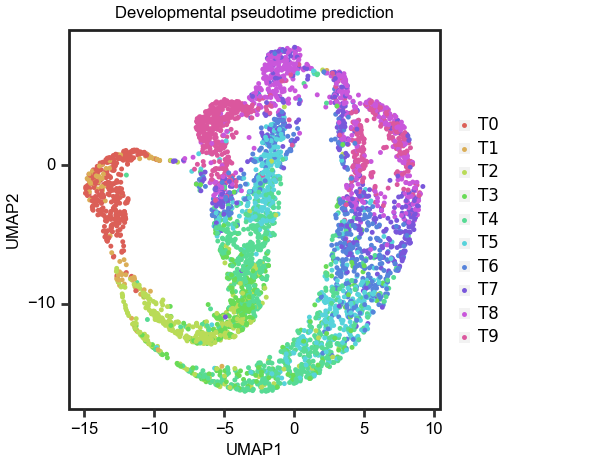

/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.05 x 2.35 in image.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figure/plant_ground_tissue_pseudotime_prediction_UMAP.pdf


In [152]:
#test developmental stage prediction

model=pickle.load(open("model/scGO_plant_pseudotime_model.pkl","rb"))


#x_test=data_rm_sparse_subset.to_numpy()
#y_test=data_rm_sparse_subset.index.tolist()

y_test_relabeled=[label_dict[label] for label in y_test]



test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=5000, shuffle=False)
result=[]
y_prob=[]
#y_test=[]
for i, data in enumerate(test_loader):
    inputs, labels = data
        
    inputs=Variable(inputs).to(torch.float32)

    labels=Variable(labels).to(torch.long)
        
    outputs,GO_sum,TF_derived_from_gene,GO_derived_from_TF = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    pred = list(torch.max(outputs, 1)[1].numpy())
    result.extend(pred)

    y_prob=outputs.detach().numpy()
    #y_test=list(labels.numpy())

pred=[label_dict_revese[label] for label in pred]


#UMAP pseudotime
from plotnine import *
import pandas as pd


black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data = pd.read_csv("data/plant/sc_ground_tissue_umap_data.csv",index_col=0)
data.columns=["UMAP1","UMAP2"]

umap_train, umap_test = ts(data,test_size=0.2,random_state=1, shuffle=True)

data=umap_test

data["prediction"]=pred

p =(ggplot(data, aes(x='UMAP1', y='UMAP2',color="factor(prediction)"))
    + geom_point(size=0.001,alpha=1)
    +theme(
        figure_size=[2.35+0.7,2.35],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.75,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("Developmental pseudotime prediction")
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
p.save('figure/plant_ground_tissue_pseudotime_prediction_UMAP.pdf')


In [20]:
#test developmental stage prediction

model=pickle.load(open("model/scGO_plant_pseudotime_model.pkl","rb"))


#x_test=data_rm_sparse_subset.to_numpy()
#y_test=data_rm_sparse_subset.index.tolist()
x_test=data_rm_sparse.to_numpy()
y_test=data_rm_sparse.index.tolist()

y_test_relabeled=[label_dict[label] for label in y_test]



test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=30000, shuffle=False)
result=[]
y_prob=[]
#y_test=[]
for i, data in enumerate(test_loader):
    inputs, labels = data
        
    inputs=Variable(inputs).to(torch.float32)

    labels=Variable(labels).to(torch.long)
        
    outputs,GO_sum,TF_derived_from_gene,GO_derived_from_TF = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    pred = list(torch.max(outputs, 1)[1].numpy())
    result.extend(pred)

    y_prob=outputs.detach().numpy()
    #y_test=list(labels.numpy())

pred=[label_dict_revese[label] for label in pred]



pred=pd.DataFrame(pred)

pred.to_csv("data/plant/sc_ground_tissue_pseudotime_prediction.csv")


AttributeError: 'ggplot' object has no attribute 'scale_color_manual'

In [26]:
data

#reoder data according to prediction

test=data_rm_sparse.loc[y_test]
test["prediction"]=pred

testt=test.sort_values(by=["prediction"])
test

MemoryError: Unable to allocate 418. GiB for an array with shape (11246084, 4987) and data type float64

In [45]:
import pandas as pd
import numpy as np

# Your NumPy array

# Convert the NumPy array to a DataFrame
df = pd.DataFrame(x_test)

# Optionally, you can specify column names and index labels
column_names = data_rm_sparse.columns.tolist()
index_labels = y_test

df.columns = column_names
df.index = index_labels

# Display the DataFrame


#sort by index
df=df.sort_index()
df

#read top gene list from txt file
top_gene_list=pd.read_csv("data/plant/top_DE_gene_cortex.txt",header=None)

top_genes=top_gene_list[0].tolist()

top_genes=[gene for gene in top_genes if gene in df.columns.tolist()]
df[top_genes]

,AT5G28060,AT2G27720,AT3G02080,AT5G16130,AT1G27400,AT3G16080,AT3G45030,AT2G01250,AT5G23740,AT5G15200,...,AT4G37010,AT5G63600,AT3G28940,AT3G48890,AT5G19230,AT4G25900,AT5G44380,AT4G15610,AT3G17420,AT1G08930
T0,37.520845,25.013897,29.182879,5.558644,63.924402,52.807115,16.675931,19.455253,13.896609,36.131184,...,1.389661,4.168983,2.779322,0.000000,0.000000,0.000000,0.000000,4.168983,0.000000,0.000000
T0,48.687185,29.560077,39.993045,27.821248,36.515389,26.082420,26.082420,29.560077,33.037733,85.202573,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.869414,0.000000,0.000000,0.000000,0.000000
T0,38.460169,32.940422,32.050141,24.393718,31.159859,27.420676,27.064563,48.075211,26.352338,78.878957,...,0.000000,0.000000,0.000000,0.890282,0.000000,0.178056,0.000000,0.000000,0.000000,0.000000
T0,26.476915,24.822108,19.857687,34.750952,31.441337,19.857687,14.893265,38.060566,24.822108,64.537481,...,0.000000,1.654807,3.309614,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
T0,18.735363,13.405475,15.020593,15.182104,21.158039,19.704433,12.597916,26.487927,18.089316,45.707825,...,0.000000,0.161512,1.453606,1.130582,0.000000,0.000000,0.000000,0.161512,1.130582,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.590584,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.590584,0.000000,0.000000
T9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.098139,0.000000,2.549070,...,17.843487,5.098139,10.196278,5.098139,20.392557,0.000000,25.490696,30.588835,0.000000,5.098139
T9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.938360,0.000000,3.876720,...,0.000000,3.876720,9.691801,15.506881,149.253731,0.000000,31.013762,29.075402,9.691801,17.445241
T9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.056078,7.392544,2.112155,27.458021,15.841166,5.280389,47.523498,57.028197,16.897244,8.448622


In [ ]:
[1] "#F8766D"
[1] "#D89000"
[1] "#A3A500"
[1] "#39B600"
[1] "#00BF7D"
[1] "#00BFC4"
[1] "#00B0F6"
[1] "#9590FF"
[1] "#E76BF3"
[1] "#FF62BC"

#heatmap df[top_genes]

import seaborn as sns
import matplotlib.pyplot as plt

#sns.set(font_scale=1.5)
#sns.set_style("whitegrid", {'axes.grid' : False})

sns.heatmap(df[top_genes], annot=False, cmap="YlGnBu")





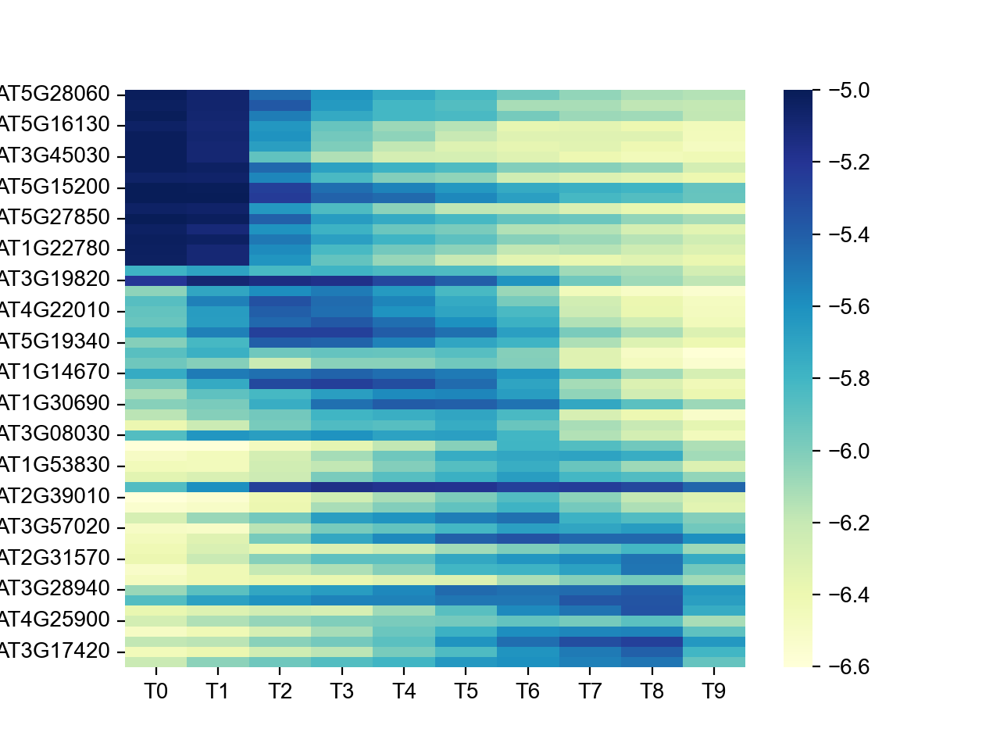

In [66]:
#heatmap df[top_genes]

test=df[top_genes]

#norm by row
#test=test.apply(lambda row: row / np.linalg.norm(row), axis=1)

#log1p
test=np.log2(test+0.01)

#if >2 , set to 2
test[test>-5]=-5

test=test.groupby(test.index).mean()
test=test.T

import seaborn as sns
import matplotlib.pyplot as plt

#sns.set(font_scale=1.5)
#sns.set_style("whitegrid", {'axes.grid' : False})

sns.heatmap(test, annot=False, cmap="YlGnBu")

plt.show()


In [60]:
test

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9
AT5G28060,-2.371156,-2.521183,-3.869085,-4.486249,-4.720190,-5.017555,-5.429551,-5.581064,-5.790508,-5.596073
AT2G27720,-2.604408,-2.764884,-3.938832,-4.715843,-5.031642,-5.256823,-5.789556,-5.848450,-5.961819,-5.738617
AT3G02080,-2.630645,-2.967734,-4.326277,-4.956226,-5.089431,-5.191524,-5.569072,-5.724525,-5.791764,-5.716780
AT5G16130,-2.911458,-3.075694,-4.745905,-5.480266,-5.787278,-5.918900,-6.295618,-6.245380,-6.311204,-6.279939
AT1G27400,-2.317447,-2.603390,-4.592242,-5.503723,-5.704016,-6.020059,-6.202442,-6.184095,-6.183799,-6.308027
AT3G16080,-2.772767,-2.955442,-4.861999,-5.651340,-5.998963,-6.186182,-6.285156,-6.204210,-6.328070,-6.319324
AT3G45030,-2.943419,-3.340302,-5.552882,-5.918331,-6.087091,-6.128499,-6.204228,-6.257182,-6.357829,-6.224206
AT2G01250,-2.306651,-2.353206,-3.964564,-4.741782,-5.046495,-5.281997,-5.691491,-5.661646,-5.801494,-5.940303
AT5G23740,-2.784300,-2.853052,-4.476974,-5.199975,-5.527850,-5.631813,-6.075942,-6.108314,-6.220243,-6.151234
AT5G15200,-1.268468,-1.352007,-2.829358,-3.786771,-4.117569,-4.525253,-4.907192,-4.875000,-5.109771,-5.059213


In [67]:
GO_sum=GO_sum.detach().numpy()
TF_derived_from_gene=TF_derived_from_gene.detach().numpy()
GO_derived_from_TF=GO_derived_from_TF.detach().numpy()


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../.conda/envs/sc/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^



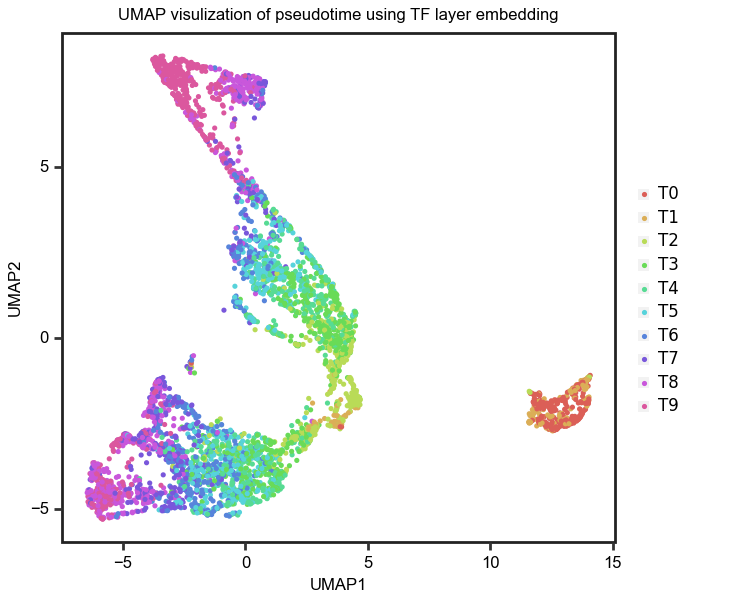

In [68]:
#embeding visualization

from plotnine import *
import pandas as pd
import umap

reducer=umap.UMAP(random_state=24)

embedding = reducer.fit_transform(TF_derived_from_gene)

black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data=pd.DataFrame(embedding)
data.columns=["UMAP1","UMAP2"]
data["label"]=y_test



p =(ggplot(aes(x='UMAP1', y='UMAP2',color='factor(label)'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2+0.7,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.35,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of pseudotime using TF layer embedding")
    #+scale_fill_manual(values=[c1, c2, c3])  
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_GO_embedding_UMAP.pdf')


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../.conda/envs/sc/lib/python3.8/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^



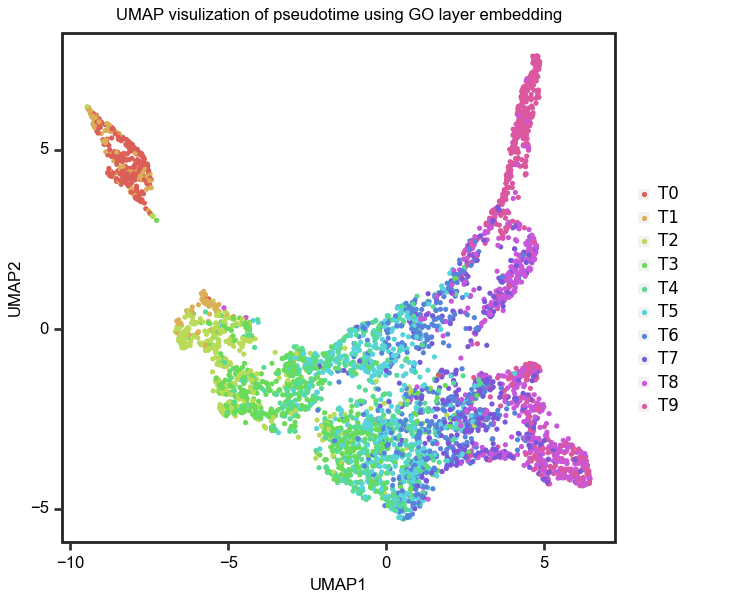

In [69]:
#embeding visualization

from plotnine import *
import pandas as pd
import umap

reducer=umap.UMAP(random_state=24)

embedding = reducer.fit_transform(GO_sum)

black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
salmen = "#FA8072"
limegreen = '#32CD32'
deepskyblue = '#00AFEE'
c1="#F8766D"
c2="#00BA38"
c3="#619CFF"



data=pd.DataFrame(embedding)
data.columns=["UMAP1","UMAP2"]
data["label"]=y_test



p =(ggplot(aes(x='UMAP1', y='UMAP2',color='factor(label)'), data)
    + geom_point(size=0.05,alpha=1)
    +theme(
        figure_size=[1.52*2+0.7,1.52*2],
        axis_text=element_text(size=6,family="Arial",color="black"),
        axis_title_x=element_text(size=6,family="Arial",color="black"),
        axis_title_y=element_text(size=6,family="Arial",color="black"),
        plot_title=element_text(margin={'b': 1, 'r': 0, 'units': 'pt'},size=6,family="Arial",color="black",hjust=0.5),
        panel_background=element_rect(fill=gray, alpha=0),
        panel_grid_major=element_line(size=0.3, alpha=0.0,color=black),
        panel_grid_minor=element_line(size=0.3, alpha=0.0,color=black),
        panel_border=element_rect(color=black, size=1),
        legend_title = element_text(size=6,alpha=0), #change legend title font size
        legend_text = element_text(size=6),
        legend_background=element_rect(size=0.5,alpha=0),
        #legend_position=(0.35,0.9), 
        legend_direction='vertical',
        #legend_position='right',
        legend_key_size=4) #change legend text font size))
    #+scale_color_manual(values =[c1, c2, c3]) 
    #+geom_density_2d(colour = "#F8766D",size=0.2,data=data_U,alpha=0.5)
    #+geom_density_2d(colour = "#00BA38",size=0.2,data=data_psU,alpha=0.5)
    +ggtitle("UMAP visulization of pseudotime using GO layer embedding")
    #+scale_fill_manual(values=[c1, c2, c3])  
    #+scale_color_manual(values=['#66C2A4', '#B2DF8A', '#2CA25F'])  
   )
#+ facet_wrap('G')
print(p)
#p.save('figure/heart_disease_GO_embedding_UMAP.pdf')

In [11]:
import pickle
from captum.attr import IntegratedGradients
from captum.attr import visualization as viz

import torch.nn.functional as F


model=pickle.load(open("model/scGO_plant_pseudotime_model.pkl","rb"))


#x_test=data_rm_sparse_subset.to_numpy()
#y_test=data_rm_sparse_subset.index.tolist()

y_test_relabeled=[label_dict[label] for label in y_test]



test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=5000, shuffle=False)
result=[]
y_prob=[]
#y_test=[]
for i, data in enumerate(test_loader):
    inputs, labels = data
        
    inputs=Variable(inputs).to(torch.float32)

    labels=Variable(labels).to(torch.long)
        
    outputs,GO_sum,TF_derived_from_gene,GO_derived_from_TF = model(inputs)    #x,GO_sum,TF_derived_from_gene,GO_derived_from_TF
    pred = torch.max(outputs, 1)[1]
    result.extend(pred)




#model=pickle.load(open("model/scGO_plant_pseudotime_model.pkl","rb"))
# Assuming model is your pretrained model
model.eval()

pred_label_idx=pred
input=inputs

integrated_gradients = IntegratedGradients(model)
#attributions_ig = integrated_gradients.attribute(input, target=pred_label_idx, n_steps=20)
# Get an input tensor (vector), `input_data`, and its corresponding target, `target`
# ...

attributions, delta = integrated_gradients.attribute(input, target=pred_label_idx, return_convergence_delta=True)


# Visualize the attributions
# ...



In [12]:
#attributions
#calculate abs of attributions and sum by column
abs_attributions = np.abs(attributions.detach().numpy())
sum_attributions = np.sum(abs_attributions, axis=0)





In [15]:
sum_attributions

#sort sum_attributions and return the top 1000 indices
sorted_indices = np.argsort(sum_attributions)[::-1][:100]
sorted_indices

array([3922, 3308,  280, 3860, 4806, 1172, 1847, 4845, 3937, 2505,  888,
        946, 1121,  419,   14, 4034, 4110, 1426, 3002, 3236, 1585, 1160,
       1894, 4877, 4553, 4276, 4681, 3532, 3952, 4132, 4320, 3073, 4063,
       3247, 3673, 3692, 1109, 4360, 2543, 4701, 2544, 4294, 2089, 4605,
       2748,  278, 3234, 2047, 1918, 2929, 2252,  356, 1963, 2325, 1389,
       3226, 2816, 1446,  437,  944, 3398, 4753, 3825,   94, 4337,  370,
        456, 2236, 3090, 3775, 3156, 2758, 1503, 3661, 2611,  405, 3832,
       4567, 2088, 3970, 3960, 1846, 3886, 4235, 2382, 2246,  236, 4514,
       1960, 2628, 3833, 2335, 4738, 1175,  250, 3542,  958, 4549, 3318,
       3252])

In [16]:
#data_rm_sparse is dataframe
import pandas as pd
#select subset columns using sorted_indices
data_rm_sparse_subset = data_rm_sparse.iloc[:,sorted_indices]
data_rm_sparse_subset 


data=pd.DataFrame()
#select index=="T0" and mean of each column
for stage in ["T0","T1","T2","T3","T4","T5","T6","T7","T8","T9"]:
    t=data_rm_sparse_subset[data_rm_sparse_subset.index==stage].mean(axis=0)
    data[stage]=t

data.to_csv("data/plant/test_heatmap.csv")

In [2]:
#read csv in R
data=read.csv("data/plant/test_heatmap.csv",header=T,sep=",",row.names=1)

data

library(pheatmap)


data=read.csv("data/plant/test_heatmap.csv",header=T,sep=",",row.names=1)


data = log2(data + 1)
#data = t(data)
data = scale((data))
#data = t(data)
data[data > 2]=2 
data[data < -2]= -2
#data=t(data)
pdf("figure/test_heatmap.pdf", width=1.22,height=1.22)
pheatmap(mat=data,cluster_rows =T, cluster_cols = F, cluster_columns = F,treeheight_row=0,show_colnames= FALSE,  show_rownames= FALSE,drop_levels= TRUE, fontsize= 6 )#,color = colorRampPalette(c("blue", "white", "orange"))(100))
dev.off()




,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AT2G36100,0.4423013,0.4016129,0.2999544,0.4086235,0.9762674,2.531938,10.407482,45.072078,98.894775,268.184687
AT3G56240,0.5847558,0.6816980,4.1965081,6.2658584,9.2656255,11.508952,14.679220,18.522484,27.737925,107.916174
AT1G13930,0.7886406,0.6574271,0.6953967,1.3113191,1.9025939,2.870345,6.494028,14.310343,31.824715,22.071096
AT2G32300,0.1581534,0.2552455,3.0128974,4.4840574,6.1281197,7.453209,10.484828,14.239349,25.164262,100.225461
AT4G34050,4.0226887,5.0835693,14.0921424,14.9771148,17.0343567,19.318232,23.603190,29.627512,40.082398,93.621641
AT1G78380,29.5171224,31.7280697,49.9426865,52.5448772,54.7538807,57.123188,53.894295,51.077926,54.426723,46.779778
AT5G40730,5.0663263,4.4793961,12.1614060,23.1465541,31.4018401,39.888272,52.194169,54.879410,41.880216,28.166423
AT4G35100,12.3961490,15.6888194,43.2625669,57.9626336,60.9025455,59.738720,57.857281,46.017882,28.970549,19.419418
AT2G36830,4.0718724,7.0571646,51.9017202,56.4214456,56.7502188,51.645030,60.075627,80.642225,111.603384,172.026314


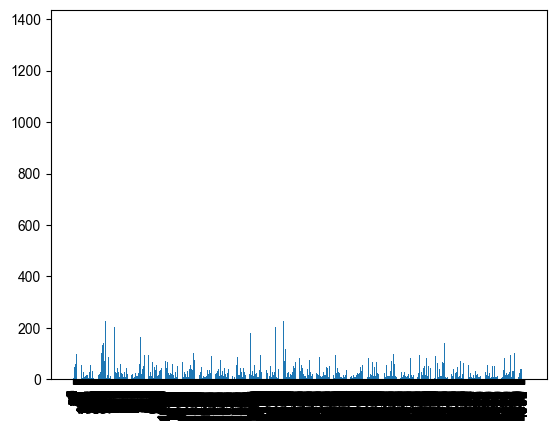

In [29]:
import matplotlib.pyplot as plt

# Assuming you have feature_names which is a list of names for each feature
#feature_names = ["feature_1", "feature_2", ...]  # replace with your actual feature names
feature_names=[str(i) for i in range(4987)]
plt.bar(feature_names, sum_attributions)
plt.xticks(rotation=90)
plt.show()


In [21]:
len(attributions[0].detach().numpy())

4987

In [43]:
#feature importance 

test_data=MyDataset(x_test,y_test_relabeled)
test_loader=DataLoader(test_data, batch_size=2000, shuffle=False)

for i, batch in enumerate(test_loader):
    input, labels = batch
    
    input=Variable(input).to(torch.float32)
    break


for i,celltype in enumerate(classes):
    print(i,celltype,data_rm_sparse.index.to_list().count(celltype))


input

0 Cortex 11073
1 Endodermis 11369
2 Quiescent Center 158


tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 2.6874],
        [0.0000, 0.0000, 2.1772,  ..., 2.1772, 4.3545, 8.7089],
        [0.0000, 5.9382, 0.0000,  ..., 5.9382, 0.0000, 0.0000],
        ...,
        [3.1348, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 9.4044],
        [0.0000, 2.5230, 1.2615,  ..., 0.0000, 0.0000, 2.5230],
        [1.8943, 3.7886, 0.9471,  ..., 0.0000, 0.0000, 0.0000]])

In [44]:


# DeepLift

from captum.attr import DeepLift

model.eval()

dl = DeepLift(model)

baseline = torch.randn_like(input)

selected_genes=[]
feature_importance=[]

#for target in [5,1,2,7]:
for target in range(0,len(classes)):
    attributions, delta = dl.attribute(input, baseline, target=target, return_convergence_delta=True)



    attributions_mean = attributions.mean(dim=0)
    attributions_sum = attributions.sum(dim=0)

    gene_list=data_rm_sparse.columns

    top_indices = np.argsort(attributions_mean.detach().numpy())[::-1][:100]    #top 10 indices 
    for index in top_indices:
        selected_genes.append(gene_list[index])
        feature_importance.append(attributions_mean[index].detach().numpy())


/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
/home/wuyou/.conda/envs/sc/lib/python3.8/site-packages/captum/attr/_core/deep_lift.py:322: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished


In [45]:
feature_importance
top_indices = np.argsort(feature_importance)[::-1][:40]

top_50_gene=[]
top_50_importance=[]

for index in top_indices:
    #print(selected_genes[index],feature_importance[index])
    if selected_genes[index] not in top_50_gene:
        top_50_gene.append(selected_genes[index])
        top_50_importance.append(float(feature_importance[index]))
    if len(top_50_gene)==40:
        break

top_50_gene

['AT1G62480',
 'AT2G36830',
 'AT2G37170',
 'AT2G36100',
 'AT4G34050',
 'AT3G13520',
 'AT2G32300',
 'AT5G46900',
 'AT3G09260',
 'AT1G05260',
 'AT4G35100',
 'AT4G30170',
 'AT1G78040',
 'AT5G53300',
 'AT2G23120',
 'AT1G78380',
 'AT5G40730',
 'AT3G54400',
 'AT2G44790',
 'AT5G13930',
 'AT3G52930',
 'AT1G20450',
 'AT5G45130',
 'AT5G56540',
 'AT1G17190',
 'AT2G17420',
 'AT5G46890',
 'AT3G26520',
 'AT3G48140',
 'AT5G17920',
 'AT3G55430',
 'AT1G61890',
 'AT4G16450',
 'AT3G53420',
 'AT5G61820',
 'AT1G20190',
 'AT3G44190',
 'AT3G20390',
 'AT4G26320',
 'AT5G19230']

<Figure size 1200x600 with 0 Axes>

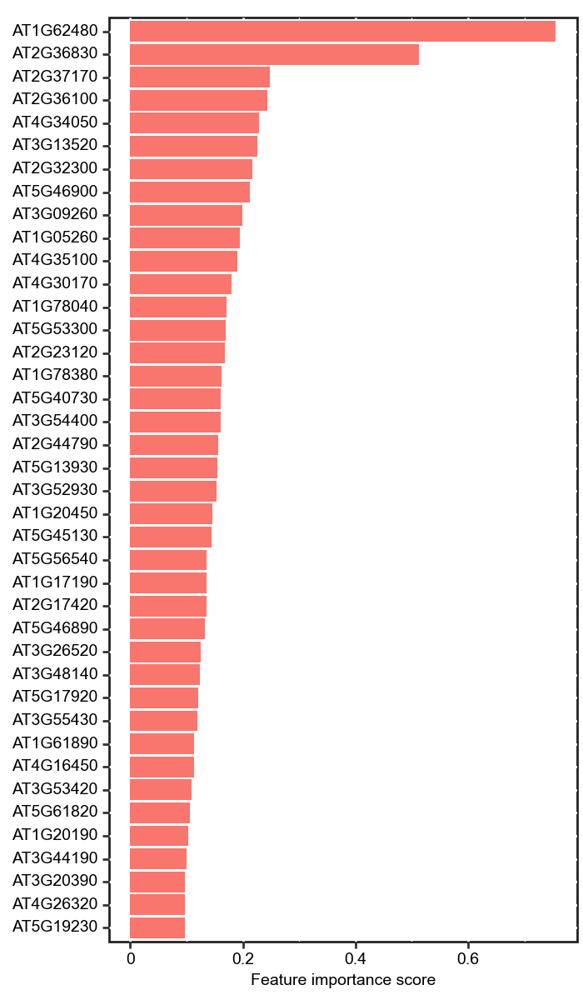

In [46]:
#barplot feature importance

from plotnine import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
black = '#222222'
gray = '#666666'
red = '#FF3333'
green = '#66CC00'
blue = '#3333FF'
purple = '#9933FF'
orange = '#FF8000'
yellow = '#FFFF33'
c1="#F8766D"
c2="#00BA38" 
c3="#619CFF"
#colors = ['black', c1, 'black', 'black','black', 'black', c1, c1,'black', 'black','black', 'black','black', 'black', 'black', 'black']


data=pd.DataFrame({"Gene":top_50_gene,"Feature importance score":top_50_importance})
data['Gene'] = pd.Categorical(data['Gene'], categories=pd.unique(data['Gene'])[::-1])  #reorder legend
plt.figure(figsize=(12, 6))

p=(ggplot(data)+
  #coord_flip()+
  geom_bar(aes(x="Gene",y="Feature importance score"),fill=c1,stat="identity")
 + coord_flip()
#+theme_bw()
  +theme(panel_background=element_rect(fill=gray, alpha=0),
            #panel_grid_major=element_line(size=0.3, alpha=0.3,color=black),
            #panel_grid_minor=element_line(size=0.3, alpha=0.3,color=black),
            panel_border=element_rect(color=black, size=1),
            axis_text=element_text(size=7,family="Arial",color="black"),
            axis_title_x=element_text(size=7,family="Arial",color="black"),
            axis_title_y=element_text(size=7,family="Arial",color="black"),
            legend_position =  "none",figure_size=[3.5,6])
   #+labs(x="")
+labs(x = "")
  
  )


#ax = p.axes[0]
#labels = ax.get_yticklabels()

#for l, c in zip(labels, colors):
    #pass
    #l.set_color(c)

print(p)
#p.show()
#p.save("figure/barplot_gene_importance.pdf")

In [51]:
#read csv, tranpose to cell by gene matrix and save
import pandas as pd

data=pd.read_csv("data/plant/ground_tissue_counts.csv",index_col=0)

data.T.to_csv("data/plant/ground_tissue_counts_cell_by_gene.csv")

In [52]:
#violinplot

import numpy as np
import scanpy as sc
import pandas as pd

sc.settings.verbosity = 3

sc.settings.set_figure_params(dpi=80, facecolor='white')

results_file = 'data/plant/ground_tissue.h5ad'  # the file that will store the analysis results

#read csv file, cell by gene matrix
adata = sc.read_csv('data/plant/ground_tissue_counts_cell_by_gene.csv', delimiter=',', first_column_names=True)

#read annotation file
adata.obs = pd.read_csv('data/plant/sc_ground_tissue_cell_type.csv', delimiter=',', index_col=0)

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([1, 2], dtype='int64'), …


In [53]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [55]:
adata.obs

,x
1,Cortex
2,Cortex
3,Endodermis
4,Endodermis
5,Cortex
...,...
22596,Endodermis
22597,Cortex
22598,Endodermis
22599,Endodermis


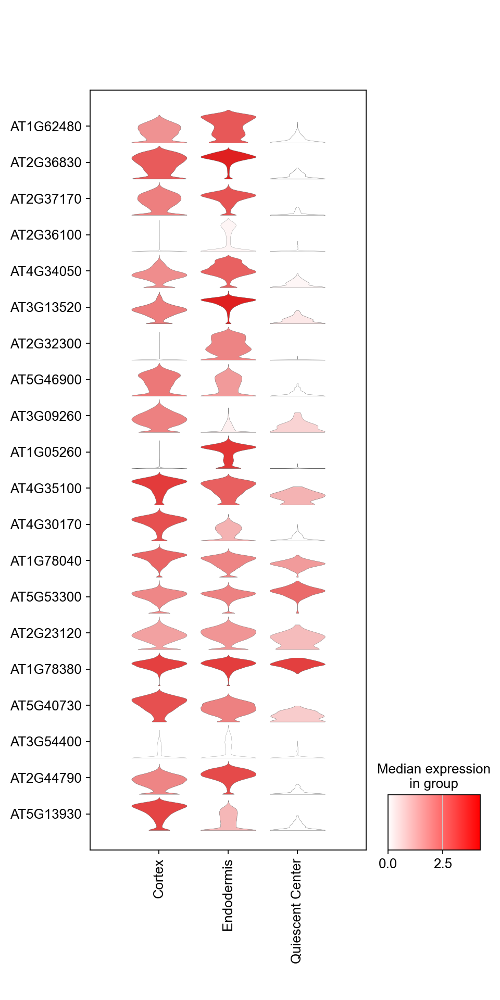

In [65]:
import matplotlib.colors as mcolors
# Define a custom colormap that transitions from white to red
cmap = mcolors.LinearSegmentedColormap.from_list('custom', ['#FFFFFF', "#FF0000"])



sc.pl.stacked_violin(adata, top_50_gene[:20], groupby='x',swap_axes=True,figsize=(6,12),cmap=cmap,save="plant_cell_type_violinplot.pdf")
